<a href="https://colab.research.google.com/github/vvrgit/NLP-LAB/blob/NLP-SRU/Natural_Language_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**What is Natural Language Processing (NLP)?**

Natural language processing (NLP) refers to the branch of computer science—and more specifically, the branch of artificial intelligence or AI—concerned with giving computers the ability to understand text and spoken words in much the same way human beings can.

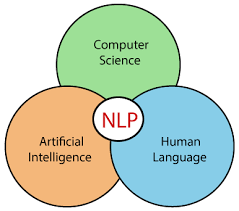

NLP stands for Natural Language Processing, which is a part of Computer Science, Human language, and Artificial Intelligence. 

It is the technology that is used by machines to understand, analyse, manipulate, and interpret human's languages. 

It helps developers to organize knowledge for performing tasks such as translation, automatic summarization, Named Entity Recognition (NER), speech recognition, relationship extraction, and topic segmentation.

**Real World Applications**

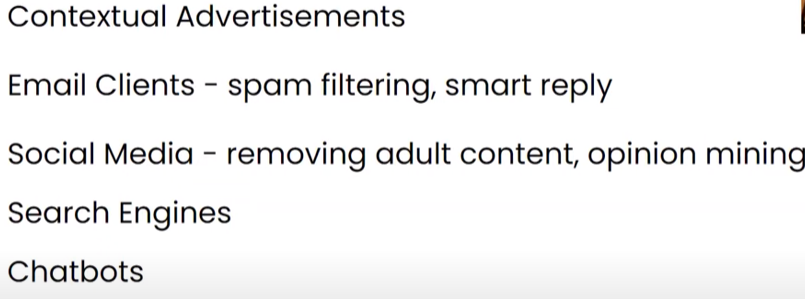

**Common NLP Tasks**

Text/Document Classification

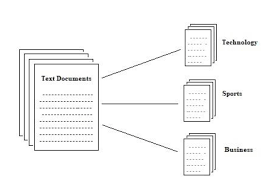

Sentiment Analysis

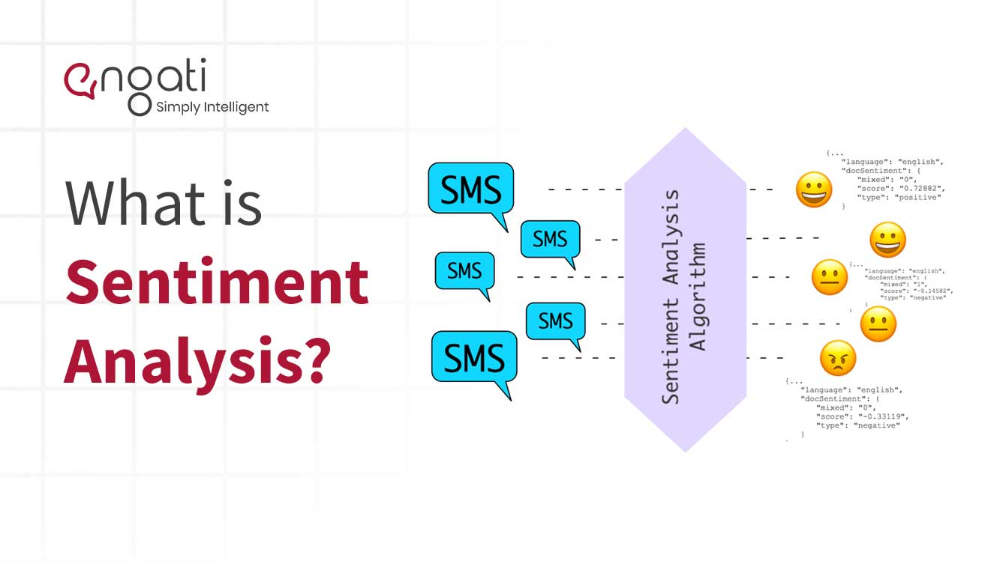

Information Retrieval

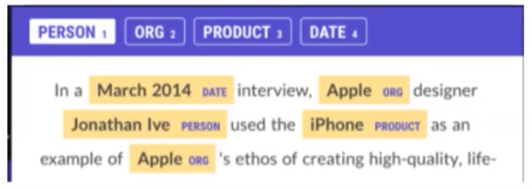

Parts of Speech Tagging

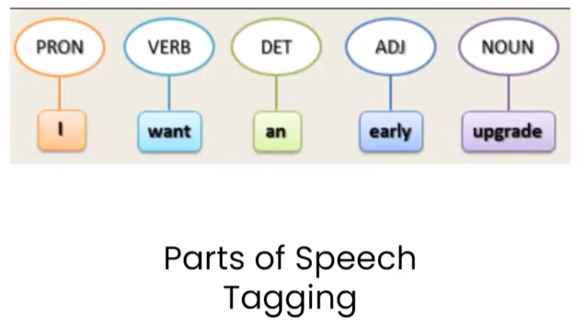

Language Detection and Machine Translation

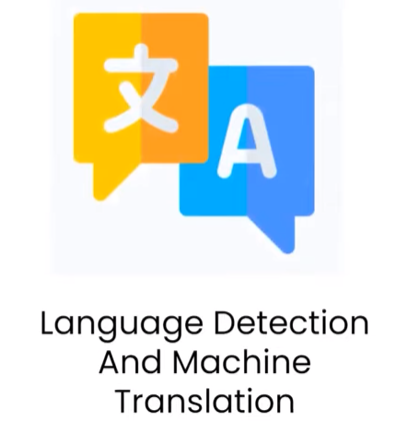

Text Summarization

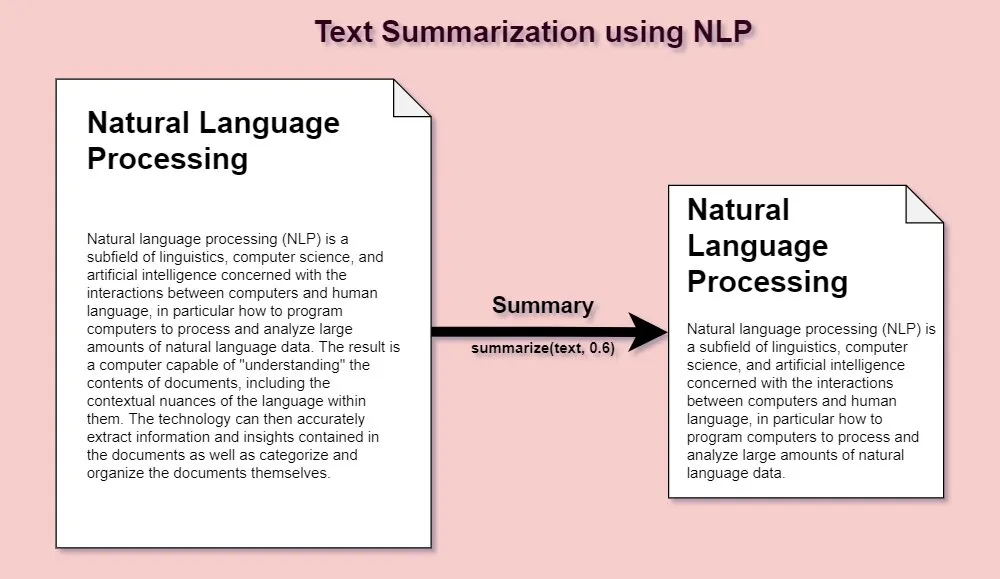

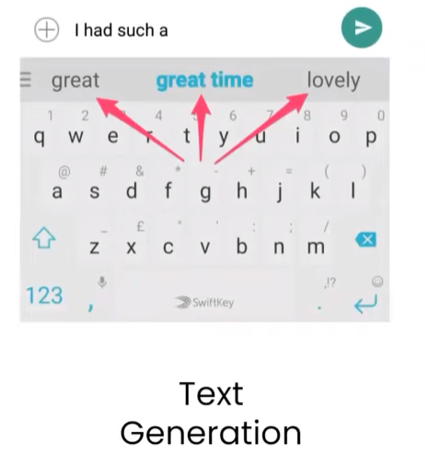

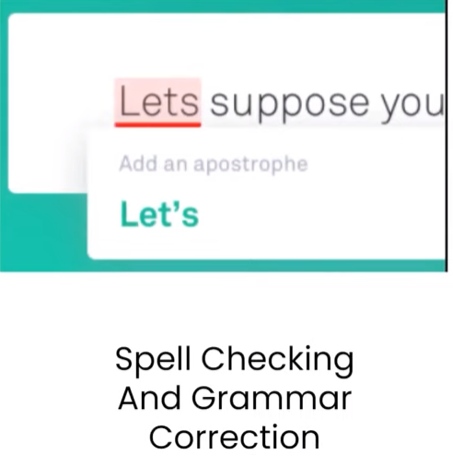

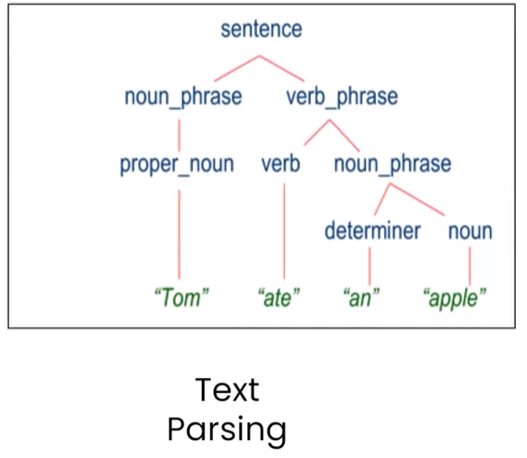

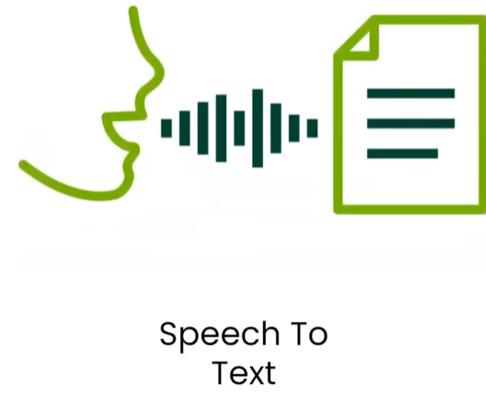

## **Approaches To NLP**

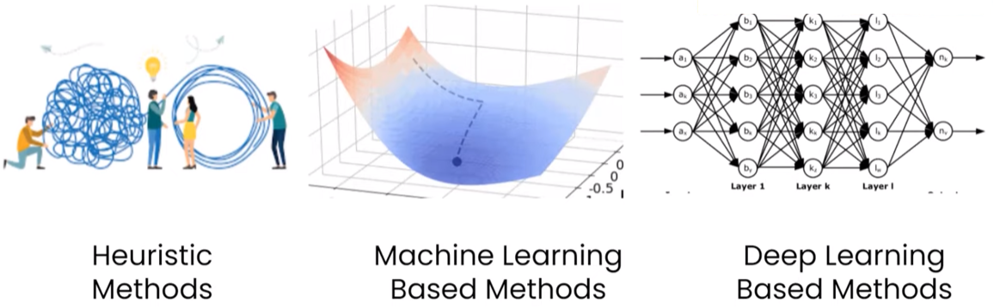

Heuristic Approaches:-- Regular Expressions, Wordnet, Open Mind Common Sense

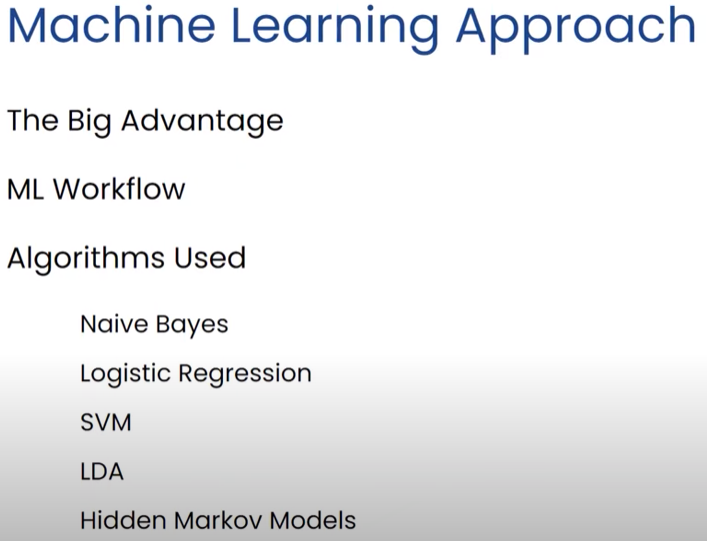

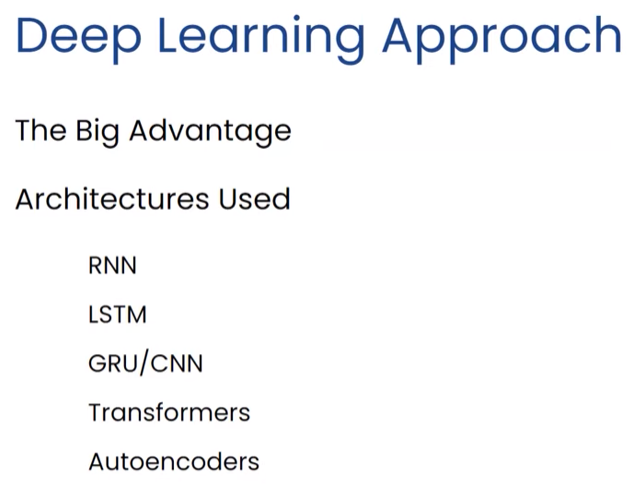

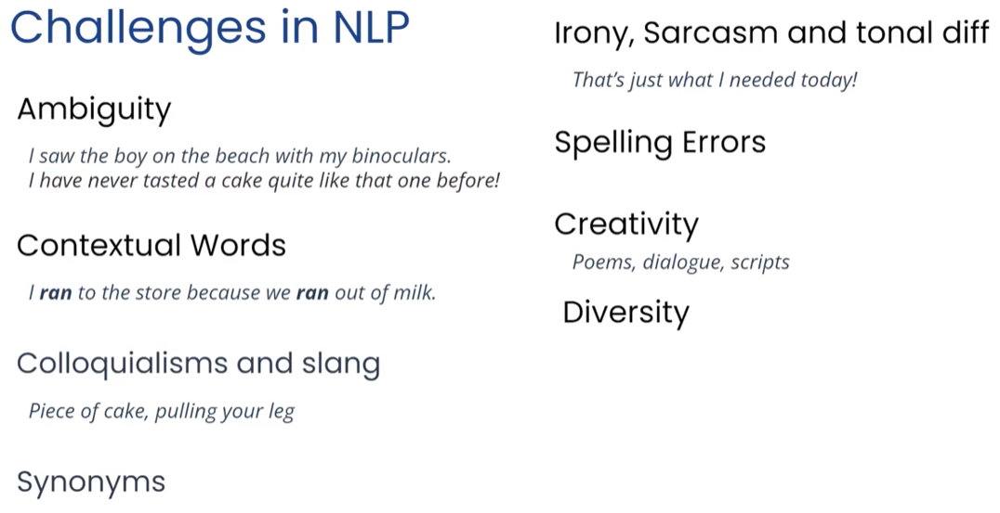

# **NLP PipeLine**

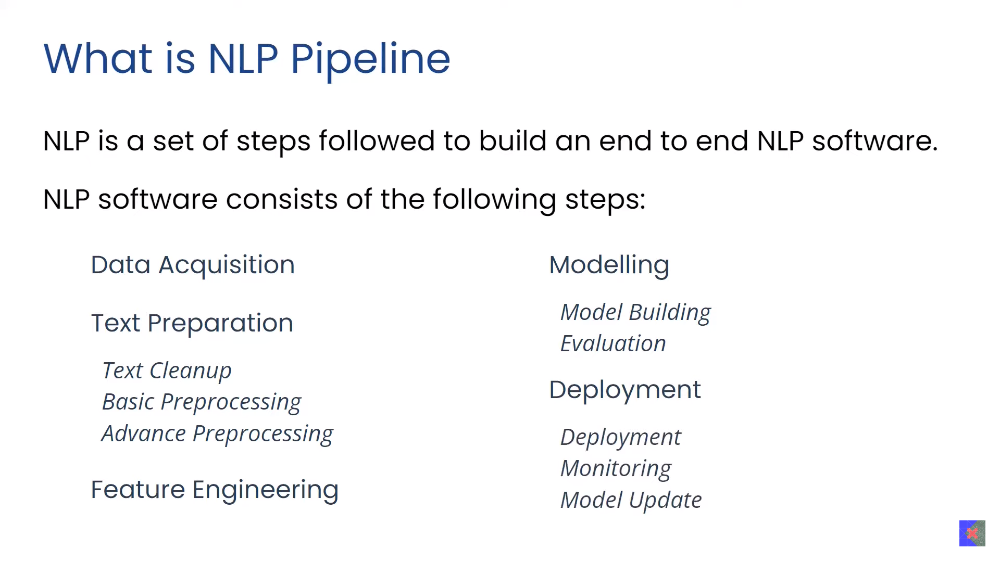

# **Data Acquisition**


1.   Available : 


*   On table: Go for next step(Text Preprocessing)
*   Database: Disucss with Data Engineer
*   Less Data: Data Augmentation (Synanoms, Biggram Flip, Back Translate, Add Noise)

2.   External Data (Public (Kaggale, Mendaly), Web Scraping, API, PDF, Image, Audio )
3.   No Data


# **Text Preparation**



1.   Cleaning (HTML tags cleaning. emoji, spell check)
2.   Basic preprocessing
3.   Advance preprocessing






# **HTML tags cleaning Using Regular Expression**

In [ ]:
text = """<div>
<h1>Title</h1>
<p>A long text........ </p>
<a href=""> a link </a>
</div>"""
text

'<div>\n<h1>Title</h1>\n<p>A long text........ </p>\n<a href=""> a link </a>\n</div>'

In [ ]:
import re
CLEANR = re.compile('<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});')

def cleanhtml(raw_html):
  cleantext = re.sub(CLEANR, '', raw_html)
  return cleantext

In [ ]:
clean_text=cleanhtml(text)
clean_text

'\nTitle\nA long text........ \n a link \n'

# **HTML tags cleaning Using BeautifulSoup**

In [ ]:
!pip install lxml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from bs4 import BeautifulSoup
cleantext = BeautifulSoup(text, "lxml").text
cleantext

'\nTitle\nA long text........ \n a link \n'

# **Emoji cleaning**

In [ ]:
import unicodedata as ud

emojis = ["💖", "💘", "💝", "💞", "❣️", "✨", "👨‍👩‍👧‍👦"]
for emoji in emojis:
    print('Emoji:',emoji)
    for cp in emoji:
        print(f'    {cp} U+{ord(cp):04X} {ud.name(cp)}')

Emoji: 💖
    💖 U+1F496 SPARKLING HEART
Emoji: 💘
    💘 U+1F498 HEART WITH ARROW
Emoji: 💝
    💝 U+1F49D HEART WITH RIBBON
Emoji: 💞
    💞 U+1F49E REVOLVING HEARTS
Emoji: ❣️
    ❣ U+2763 HEAVY HEART EXCLAMATION MARK ORNAMENT
    ️ U+FE0F VARIATION SELECTOR-16
Emoji: ✨
    ✨ U+2728 SPARKLES
Emoji: 👨‍👩‍👧‍👦
    👨 U+1F468 MAN
    ‍ U+200D ZERO WIDTH JOINER
    👩 U+1F469 WOMAN
    ‍ U+200D ZERO WIDTH JOINER
    👧 U+1F467 GIRL
    ‍ U+200D ZERO WIDTH JOINER
    👦 U+1F466 BOY


In [ ]:
import re
def remove_emoji(string):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F" # emoticons
                           u"\U0001F300-\U0001F5FF" # symbols & pictographs
                           u"\U0001F680-\U0001F6FF" # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF" # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)
text1 = "Hilarious 😂. The feeling of making a sale 😎, The feeling of actually fulfilling orders 😒"
remove_emoji(text1)

'Hilarious . The feeling of making a sale , The feeling of actually fulfilling orders '

In [ ]:
text1 = "Hilarious 😂. The feeling of making a sale 😎, The feeling of actually fulfilling orders 😒"

In [ ]:
clean_text=text1.encode('utf-8')
clean_text

b'Hilarious \xf0\x9f\x98\x82. The feeling of making a sale \xf0\x9f\x98\x8e, The feeling of actually fulfilling orders \xf0\x9f\x98\x92'

In [ ]:
#Installing emot library
!pip install emot
#Importing libraries
import re
from emot.emo_unicode import UNICODE_EMOJI # For emojis
from emot.emo_unicode import EMOTICONS_EMO # For EMOTICONS

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Function for converting emojis into word
def convert_emojis(text):
    for emot in UNICODE_EMOJI:
        text = text.replace(emot, "_".join(UNICODE_EMOJI[emot].replace(",","").replace(":","").split()))
    return text

convert_emojis(text1)

'Hilarious face_with_tears_of_joy. The feeling of making a sale smiling_face_with_sunglasses, The feeling of actually fulfilling orders unamused_face'

# **Spell Check**

In [ ]:
!pip install textblob

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
text='I Want to satisify my studant with my leeture'
text

'I Want to satisify my studant with my leeture'

In [ ]:
from textblob import TextBlob
print("original text: "+text)
b = TextBlob(text)
 
# prints the corrected spelling
print("corrected text: "+str(b.correct()))

original text: I Want to satisify my studant with my leeture
corrected text: I Want to satisfy my student with my lecture


# **Basic preprocessing**

In Python tokenization basically refers to splitting up a larger body of text into smaller lines, words or even creating words for a non-English language.

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
from nltk import sent_tokenize,word_tokenize

In [ ]:
sentence_data = "The First sentence is about Python. The Second: about Django. You can learn Python,Django and Data Ananlysis here. "

In [ ]:
sents=sent_tokenize(sentence_data)
sents

['The First sentence is about Python.',
 'The Second: about Django.',
 'You can learn Python,Django and Data Ananlysis here.']

In [ ]:
for sent in sents:
  word=word_tokenize(sent)
  print(word)

['The', 'First', 'sentence', 'is', 'about', 'Python', '.']
['The', 'Second', ':', 'about', 'Django', '.']
['You', 'can', 'learn', 'Python', ',', 'Django', 'and', 'Data', 'Ananlysis', 'here', '.']


**Stop Word Removal**

Stopwords are the English words which does not add much meaning to a sentence. They can safely be ignored without sacrificing the meaning of the sentence. For example, the words like the, a, an, is, have etc. Such words are already captured this in corpus named corpus. We first download it to our python environment.

In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import nltk
from nltk.corpus import stopwords
print(stopwords.words('english'))

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
from nltk.corpus import stopwords
print(stopwords.fileids())

['arabic', 'azerbaijani', 'basque', 'bengali', 'catalan', 'chinese', 'danish', 'dutch', 'english', 'finnish', 'french', 'german', 'greek', 'hebrew', 'hinglish', 'hungarian', 'indonesian', 'italian', 'kazakh', 'nepali', 'norwegian', 'portuguese', 'romanian', 'russian', 'slovene', 'spanish', 'swedish', 'tajik', 'turkish']


In [ ]:
example_sent = """This is a sample sentence,
                  showing off the stop words filtration."""

In [ ]:
stop_words = set(stopwords.words('english'))
stop_words

In [ ]:
word_tokens = word_tokenize(example_sent)
word_tokens

['This',
 'is',
 'a',
 'sample',
 'sentence',
 ',',
 'showing',
 'off',
 'the',
 'stop',
 'words',
 'filtration',
 '.']

In [ ]:
filtered_sentence = []
for w in word_tokens:
    if w not in stop_words:
        filtered_sentence.append(w)
  
print(word_tokens)
print(filtered_sentence)

['This', 'is', 'a', 'sample', 'sentence', ',', 'showing', 'off', 'the', 'stop', 'words', 'filtration', '.']
['This', 'sample', 'sentence', ',', 'showing', 'stop', 'words', 'filtration', '.']


In [ ]:
import io 
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
  
# word_tokenize accepts
# a string as an input, not a file. 
stop_words = set(stopwords.words('english')) 
file1 = open("/content/drive/MyDrive/AI Data/text.txt") 
  
# Use this to read file content as a stream: 
line = file1.read()
words = word_tokenize(line)
filtered_sentence = []
for r in words: 
    if not r in stop_words: 
        filtered_sentence.append(r) 
filtered_sentence

['Hi',
 'I',
 'venkat',
 'SR',
 'University',
 '.',
 'This',
 'sample',
 'sentence',
 ',',
 'showing',
 'stop',
 'words',
 'filtration',
 '.']

In [ ]:
import io 
from nltk.corpus import stopwords 
from nltk.tokenize import word_tokenize 
  
# word_tokenize accepts
# a string as an input, not a file. 
stop_words = set(stopwords.words('english')) 
file1 = open("/content/drive/MyDrive/AI Data/text.txt") 
  
# Use this to read file content as a stream: 
line = file1.read()
words = word_tokenize(line) 
for r in words: 
    if not r in stop_words: 
        appendFile = open('/content/drive/MyDrive/AI Data/filteredtext.txt','a') 
        appendFile.write(" "+r) 
        appendFile.close() 

# **Stemming**

In the areas of Natural Language Processing we come across situation where two or more words have a common root. For example, the three words - agreed, agreeing and agreeable have the same root word agree. A search involving any of these words should treat them as the same word which is the root word. So, it becomes essential to link all the words into their root word. The NLTK library has methods to do this linking and give the output showing the root word.

In [ ]:
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from functools import reduce
 
ps = PorterStemmer()
 
sentence = "Programmers program with programming languages"
words = word_tokenize(sentence)
 
# using reduce to apply stemmer to each word and join them back into a string
stemmed_sentence = reduce(lambda x, y: x + " " + ps.stem(y), words, "")
 
print(stemmed_sentence)

 programm program with program languag


In [ ]:
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
  
ps = PorterStemmer()
sentence = "Programmers program with programming languages"
words = word_tokenize(sentence)
  
for r in words:
  appendFile = open('/content/drive/MyDrive/AI Data/filteredtext.txt','a') 
  appendFile.write(" "+ps.stem(r)) 
  appendFile.close() 

# **LancasterStemmer**

In [ ]:
from nltk.stem.lancaster import LancasterStemmer
from nltk.tokenize import word_tokenize
from functools import reduce
 
ps = LancasterStemmer()
 
sentence = "Programmers program with programming languages"
words = word_tokenize(sentence)
 
# using reduce to apply stemmer to each word and join them back into a string
stemmed_sentence = reduce(lambda x, y: x + " " + ps.stem(y), words, "")
 
print(stemmed_sentence)

 program program with program langu


# **SnowballStemme**r

In [ ]:
from nltk.stem import SnowballStemmer
from nltk.tokenize import word_tokenize
from functools import reduce
 
ps = SnowballStemmer("english")
 
sentence = "Programmers program with programming languages"
words = word_tokenize(sentence)
 
# using reduce to apply stemmer to each word and join them back into a string
stemmed_sentence = reduce(lambda x, y: x + " " + ps.stem(y), words, "")
 
print(stemmed_sentence)

 programm program with program languag


In [ ]:
# Import the re module
import re
# string with special characters 
special_string="spe@#$ci87al*&"
print("String before conversion: ",special_string)
#using regular expression with the sub() method
normal_string =re.sub("[^A-Z]", "", special_string,0,re.IGNORECASE)
print("String after conversion: ",normal_string)

String before conversion:  spe@#$ci87al*&
String after conversion:  special


# **Lower case conversion**

In [ ]:
text = 'G3Ek5 F0R gE3K5'
 
print("Original String:")
print(text)
 
# lower() function to convert
# string to lower_case
print("\nConverted String:")
print(text.lower())

Original String:
G3Ek5 F0R gE3K5

Converted String:
g3ek5 f0r ge3k5


# **Language Detection**

In [ ]:
!pip install langdetect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 18.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993224 sha256=4e9b8b50dac86e2e4802d5be28966e564ea24681a89b2c5da81a77085cbe64c5
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect


In [ ]:
from langdetect import detect
 
 
# Specifying the language for
# detection
print(detect("Geeksforgeeks is a computer science portal for geeks"))
print(detect("Geeksforgeeks - это компьютерный портал для гиков"))
print(detect("Geeksforgeeks es un portal informático para geeks"))
print(detect("Geeksforgeeks是面向极客的计算机科学门户"))
print(detect("Geeksforgeeks geeks के लिए एक कंप्यूटर विज्ञान पोर्टल है"))
print(detect("Geeksforgeeksは、ギーク向けのコンピューターサイエンスポータルです。"))
print(detect("Geeksforgeeks అనేది గీక్స్ కోసం ఒక కంప్యూటర్ సైన్స్ పోర్టల్"))

en
ru
es
af
hi
ja
te


# **Advance Preprocessing**

**Parts of Speech Tagging**

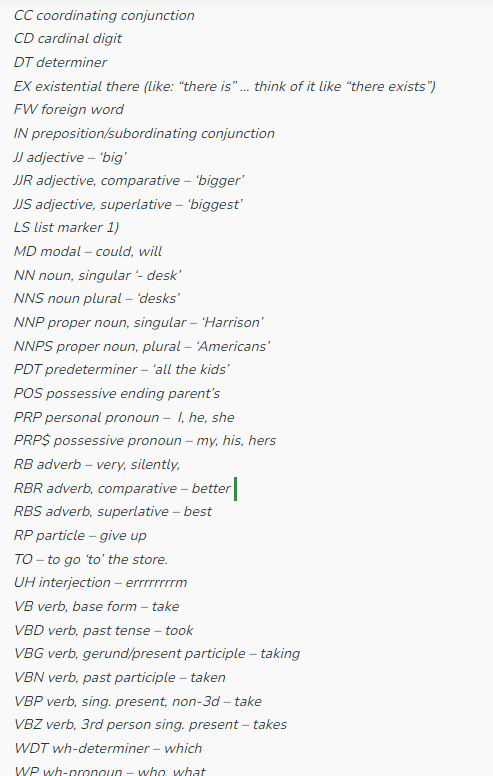

In [ ]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
stop_words = set(stopwords.words('english'))
 

txt = "Sukanya, Rajib and Naba are my good friends. " \
    "Sukanya is getting married next year. " \
    "Marriage is a big step in one’s life." \
    "It is both exciting and frightening. " \
    "But friendship is a sacred bond between people." \
    "It is a special kind of love between us. " \
    "Many of you must have tried searching for a friend "\
    "but never found the right one."
 
# sent_tokenize is one of instances of
# PunktSentenceTokenizer from the nltk.tokenize.punkt module
 
tokenized = sent_tokenize(txt)
for i in tokenized:
     
    # Word tokenizers is used to find the words
    # and punctuation in a string
    wordsList = nltk.word_tokenize(i)
 
    # removing stop words from wordList
    wordsList = [w for w in wordsList if not w in stop_words]
 
    #  Using a Tagger. Which is part-of-speech
    # tagger or POS-tagger.
    tagged = nltk.pos_tag(wordsList)
 
    print(tagged)

[('Sukanya', 'NNP'), (',', ','), ('Rajib', 'NNP'), ('Naba', 'NNP'), ('good', 'JJ'), ('friends', 'NNS'), ('.', '.')]
[('Sukanya', 'NNP'), ('getting', 'VBG'), ('married', 'VBN'), ('next', 'JJ'), ('year', 'NN'), ('.', '.')]
[('Marriage', 'NN'), ('big', 'JJ'), ('step', 'NN'), ('one', 'CD'), ('’', 'NN'), ('life.It', 'NN'), ('exciting', 'VBG'), ('frightening', 'NN'), ('.', '.')]
[('But', 'CC'), ('friendship', 'NN'), ('sacred', 'VBD'), ('bond', 'NN'), ('people.It', 'NN'), ('special', 'JJ'), ('kind', 'NN'), ('love', 'VB'), ('us', 'PRP'), ('.', '.')]
[('Many', 'JJ'), ('must', 'MD'), ('tried', 'VB'), ('searching', 'VBG'), ('friend', 'NN'), ('never', 'RB'), ('found', 'VBD'), ('right', 'JJ'), ('one', 'CD'), ('.', '.')]


**Parsing**

---



One of the important use cases of Natural Language Processing (NLP) is generative text.

Generative text is predicting what word must come next in a sentence.

Applications of generative text are question-answering chatbots, sentence or word autocorrection, and autocompletion, grammar check

To help us know what word will come next we need to learn as much as we can what words previously came in a sentence.

To fulfil this need and to understand what words came priorly is where **parts of speech** and syntactic **parsing** are very important and integral topics in NLP.

The **language syntax** is fundamental for generative text and sets the foundation for parts of speech and parse trees.

**language synta**x means how the language is structured or arranged.

**Coreference Resolution**

---



Coreference Resolution comes with NLP and it tries to find all linguistic expressions in a given text that refer to the same real-world entity.

Suppose you have to find the pronouns in a sentence and replace them with relevant nouns. **Coreference resolution** can be used to do that. It finds and groups the words which refer to the same entities and replaces pronouns with noun phrases. 

Consider the following sentence.

“I gave my laptop to Andrew because he told me that he needs it to do his assignment” Peter said.

In Coreference Resolution first, it groups the words into several groups by considering entities. In this sentence the main entities are



1.   Andrew
2.   Peter
3.   Peter’s Laptop


According to those entities, it can divide nouns and pronouns into several groups.

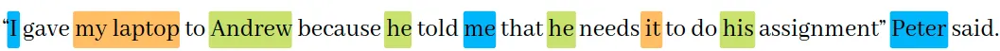

After that, it replaces all the pronouns in the sentence with relevant nouns.

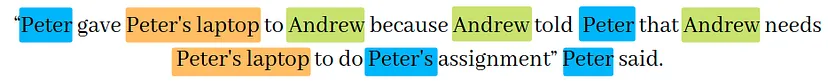


Coreference resolution is using in a variety of NLP tasks such as,



1.   Text understanding
2.   Document summarization
3.   Information extraction
4.   Sentiment analysis
5.   Machine translation


# **Feature Engineering**

Convert text into numbers

Let consider sentiment analysis case study

Data Sample1:  Movie songs are good  :  P(1)  N(0)  Nut(3) : Postive (1)

Data Sample1:  Movie is boring  :  P(0)  N(1)  Nut(2) : Negative (0)

Data Sample1:  Screenplay is soo bad  :  P(1)  N(0)  Nut(3) : Postive (0)

**ML Pipeline:**  Data -- Text Preprocessing -- Feature Engineering -- Model Training - Testing - Deployment - Monitoring - Update

**DL Pipeline**: Data -- Text Preprocessing -- Model Training - Testing - Deployment - Monitoring - Update

# **Modeling**

Chossing of model/approach is depends on amount data available and nature of problem

1.   Heuristic Approach (Suitable, if sufficient data is not available, you can prepare rules)
2.   ML Approach (Suffienct data available, can noty prepare rules)
3.   DL Approach (Huge Data available), can use tranfer learning
4.   Cloud API



**Evaluation**



1.   Intrensic (Model performace while developing like accuracy, precision, recall, loss etc.)
2.   Extrensic (Bussiness point of view like how many accepted suggestions )

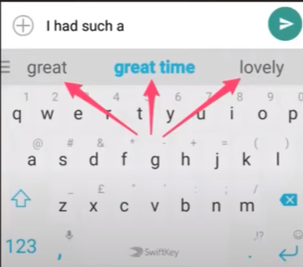



**Deployment**



1.   Deploy (As API, Chatbot, Web App, Mobile App)
2.   Monitor (Extrensic, In the form of Dashboard)
3.   Update  (Update model based on new data)



**Assignment**

1.  Data Acquisition 
    From where would you acquire the data?
2.  Text Preparation
    What kind of cleaning steps would you perform?
    What text preprocessing step would you apply?
    Is advanced text preprocessing required?
3.  Feature Engineering
    What kind of features would you create?
4.  Modelling
    What algorithm would you use to solve the problem at hand?
    What intrinsic evaluation metrics would you use?
    What extrinsic evaluation metrics would you use?
5.  Deployment
    How would you deploy your solution into the entire product?
    How and what things will you monitor?
    What would be your model update strategy?


# **Text Preprocessing Excercise - 2**

**Import Data**

In [ ]:
import pandas as pd

In [ ]:
df=pd.read_csv('/content/drive/MyDrive/AI Data/NLP Data/IMDB Dataset.csv')

In [ ]:
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [ ]:
df.shape

(50000, 2)

In [ ]:
df['review'][2]

'I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air conditioned theater and watching a light-hearted comedy. The plot is simplistic, but the dialogue is witty and the characters are likable (even the well bread suspected serial killer). While some may be disappointed when they realize this is not Match Point 2: Risk Addiction, I thought it was proof that Woody Allen is still fully in control of the style many of us have grown to love.<br /><br />This was the most I\'d laughed at one of Woody\'s comedies in years (dare I say a decade?). While I\'ve never been impressed with Scarlet Johanson, in this she managed to tone down her "sexy" image and jumped right into a average, but spirited young woman.<br /><br />This may not be the crown jewel of his career, but it was wittier than "Devil Wears Prada" and more interesting than "Superman" a great comedy to go see with friends.'

**Data Lowercasing**

In [ ]:
df['review'][2].lower()

'i thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air conditioned theater and watching a light-hearted comedy. the plot is simplistic, but the dialogue is witty and the characters are likable (even the well bread suspected serial killer). while some may be disappointed when they realize this is not match point 2: risk addiction, i thought it was proof that woody allen is still fully in control of the style many of us have grown to love.<br /><br />this was the most i\'d laughed at one of woody\'s comedies in years (dare i say a decade?). while i\'ve never been impressed with scarlet johanson, in this she managed to tone down her "sexy" image and jumped right into a average, but spirited young woman.<br /><br />this may not be the crown jewel of his career, but it was wittier than "devil wears prada" and more interesting than "superman" a great comedy to go see with friends.'

In [ ]:
df['review']=df['review'].str.lower()
df.head()

,review,sentiment
0,one of the other reviewers has mentioned that ...,positive
1,a wonderful little production. <br /><br />the...,positive
2,i thought this was a wonderful way to spend ti...,positive
3,basically there's a family where a little boy ...,negative
4,"petter mattei's ""love in the time of money"" is...",positive


**HTML tag Removal**

In [ ]:
import re
def remove_html_tag(text):
  pattern=re.compile('<.*?>')
  return pattern.sub(r'',text)

In [ ]:
text="<title>IMDB Dataset of 50K Movie Reviews | Kaggle</title>"

In [ ]:
print(remove_html_tag(text))

IMDB Dataset of 50K Movie Reviews | Kaggle


In [ ]:
df['review']=df['review'].apply(remove_html_tag)

In [ ]:
df.head()

,review,sentiment
0,one of the other reviewers has mentioned that ...,positive
1,a wonderful little production. the filming tec...,positive
2,i thought this was a wonderful way to spend ti...,positive
3,basically there's a family where a little boy ...,negative
4,"petter mattei's ""love in the time of money"" is...",positive


**Remove URLs**

In [ ]:
import re
def remove_url(text):
  pattern=re.compile(r'https?://\S+|www\.\S+')
  return pattern.sub(r'',text)

In [ ]:
text='My Google Scholar account can be accessed using https://scholar.google.com/scholar?hl=en&as_sdt=0%2C5&q=venkataramana+veeramsetty&oq='
text

'My Google Scholar account can be accessed using https://scholar.google.com/scholar?hl=en&as_sdt=0%2C5&q=venkataramana+veeramsetty&oq='

In [ ]:
text=remove_url(text)

In [ ]:
text

'My Google Scholar account can be accessed using '

**Remove Punctuations**

Method-1

In [ ]:
import string,time
execlude=string.punctuation

In [ ]:
text='string with puncuation!'
text

'string with puncuation!'

In [ ]:
def remove_pun(text):
  for char in execlude:
    text=text.replace(char,'')
  return text

In [ ]:
text=remove_pun(text)

In [ ]:
text

'string with puncuation'

In [ ]:
start=time.time()
remove_pun(text)
time2=time.time()-start
time2

0.0001049041748046875

Method-2

In [ ]:
import string
execlude=string.punctuation

In [ ]:
def remove_punc_method2(text):
  return text.translate(str.maketrans('','',execlude))

In [ ]:
df['review']=df['review'].apply(remove_punc_method2)
df.head()

,review,sentiment
0,one of the other reviewers has mentioned that ...,positive
1,a wonderful little production the filming tech...,positive
2,i thought this was a wonderful way to spend ti...,positive
3,basically theres a family where a little boy j...,negative
4,petter matteis love in the time of money is a ...,positive


**Chat Word Treatment**

In [ ]:
chat_words = {
'AFAIK':'As Far As I Know',
'AFK':'Away From Keyboard',
'ASAP':'As Soon As Possibl',
'ATK':'At The Keyboard',
'ATM':'At The Moment',
'A3':'Anytime, Anywhere, Anyplace',
'BAK':'Back At Keyboard',
'BBL':'Be Back Later',
'BBS':'Be Back Soon',
'BFN':'Bye For Now',
'B4N':'Bye For Now',
'BRB':'Be Right Back',
'BRT':'Be Right There',
'BTW':'By The Way',
'B4':'Before',
'B4N':'Bye For Now',
'CU':'See You',
'CUL8R':'See You Later',
'CYA':'See You',
'FAQ':'Frequently Asked Questions',
'FC':'Fingers Crossed',
'FWIW':'For What Its Worth',
'FYI':'For Your Information',
'GAL':'Get A Life',
'GG':'Good Game',
'GN':'Good Night',
'GMTA':'Great Minds Think Alike',
'GR8':'Great!',
'G9':'Genius',
'IC':'I See',
'ICQ':'I Seek you',
'ILU':'I Love You',
'IMHO':'In My Honest/Humble Opinion',
'IMO':'In My Opinion',
'IOW':'In Other Words',
'IRL':'In Real Life',
'KISS':'Keep It Simple, Stupid',
'LDR':'Long Distance Relationship',
'LMAO':'Laugh My A.. Off',
'LOL':'Laughing Out Loud',
'LTNS':'Long Time No See',
'L8R':'Later',
'MTE':'My Thoughts Exactly',
'M8':'Mate',
'NRN':'No Reply Necessary',
'OIC':'Oh I See',
'PITA':'Pain In The A..',
'PRT':'Party',
'PRW':'Parents Are Watching',
'ROFL':'Rolling On The Floor Laughing',
'ROFLOL':'Rolling On The Floor Laughing Out Loud',
'ROTFLMAO':'Rolling On The Floor Laughing My A.. Off',
'SK8':'Skate',
'STATS':'Your sex and age',
'ASL':'Age, Sex, Location',
'THX':'Thank You',
'TTFN':'Ta-Ta For Now!',
'TTYL':'Talk To You Later',
'U':'You',
'U2':'You Too',
'U4E':'Yours For Ever',
'WB':'Welcome Back',
'WTF':'What The F...',
'WTG':'Way To Go!',
'WUF':'Where Are You From?',
'W8':'Wait...'
}


In [ ]:
chat_words

{'AFAIK': 'As Far As I Know',
 'AFK': 'Away From Keyboard',
 'ASAP': 'As Soon As Possibl',
 'ATK': 'At The Keyboard',
 'ATM': 'At The Moment',
 'A3': 'Anytime, Anywhere, Anyplace',
 'BAK': 'Back At Keyboard',
 'BBL': 'Be Back Later',
 'BBS': 'Be Back Soon',
 'BFN': 'Bye For Now',
 'B4N': 'Bye For Now',
 'BRB': 'Be Right Back',
 'BRT': 'Be Right There',
 'BTW': 'By The Way',
 'B4': 'Before',
 'CU': 'See You',
 'CUL8R': 'See You Later',
 'CYA': 'See You',
 'FAQ': 'Frequently Asked Questions',
 'FC': 'Fingers Crossed',
 'FWIW': 'For What Its Worth',
 'FYI': 'For Your Information',
 'GAL': 'Get A Life',
 'GG': 'Good Game',
 'GN': 'Good Night',
 'GMTA': 'Great Minds Think Alike',
 'GR8': 'Great!',
 'G9': 'Genius',
 'IC': 'I See',
 'ICQ': 'I Seek you',
 'ILU': 'I Love You',
 'IMHO': 'In My Honest/Humble Opinion',
 'IMO': 'In My Opinion',
 'IOW': 'In Other Words',
 'IRL': 'In Real Life',
 'KISS': 'Keep It Simple, Stupid',
 'LDR': 'Long Distance Relationship',
 'LMAO': 'Laugh My A.. Off',
 'LO

In [ ]:
def chat_conversion(text):
  new_text=[]
  for w in text.split():
    if w.upper() in chat_words:
      new_text.append(chat_words[w.upper()])
    else:
      new_text.append(w)
  return " ".join(new_text)

In [ ]:
chat_conversion('IMHO he is the best')

'In My Honest/Humble Opinion he is the best'

In [ ]:
df['review']=df['review'].apply(chat_conversion)
df.head()

,review,sentiment
0,one of the other reviewers has mentioned that ...,positive
1,a wonderful little production the filming tech...,positive
2,i thought this was a wonderful way to spend ti...,positive
3,basically theres a family where a little boy j...,negative
4,petter matteis love in the time of money is a ...,positive


**Spelling Correction**

In [ ]:
from textblob import TextBlob

In [ ]:
incorrect_text = "I like to raed stroy boaks"

In [ ]:
text_blob = TextBlob(incorrect_text)

In [ ]:
text_blob.correct().string

'I like to red story books'

In [ ]:
from textblob import TextBlob
def Speel_Correction(incorrect_text):
  text_blob = TextBlob(incorrect_text)
  return text_blob.correct().string

In [ ]:
df['review']=df['review'].apply(Speel_Correction)
df.head()

**Removing stopwords**

In [ ]:
import nltk
stop_words=nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
import nltk
stop_words=nltk.download('stopwords') # a, an, the, am, is etc.
from nltk.corpus import stopwords
def Remove_Stopwords(text):
  new_text=[]
  for word in text.split():
    if word in stopwords.words('english'):
      new_text.append('')
    else:
      new_text.append(word)
  x=new_text[:]
  new_text.clear()
  return " ".join(x)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df['review']=df['review'].apply(Remove_Stopwords)
df.head()

,review,sentiment
0,one reviewers mentioned watching 1 oz e...,positive
1,wonderful little production filming techniqu...,positive
2,thought wonderful way spend time hot s...,positive
3,basically theres family little boy jake thi...,negative
4,petter matteis love time money visually s...,positive


**Handling Emojis**

Method1 - Removing Emoji

In [ ]:
import re
def remove_emoji(string):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F" # emoticons
                           u"\U0001F300-\U0001F5FF" # symbols & pictographs
                           u"\U0001F680-\U0001F6FF" # transport & map symbols
                           u"\U0001F1E0-\U0001F1FF" # flags (iOS)
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', string)

In [ ]:
text1 = "Hilarious 😂. The feeling of making a sale 😎, The feeling of actually fulfilling orders 😒"

In [ ]:
remove_emoji(text1)

'Hilarious . The feeling of making a sale , The feeling of actually fulfilling orders '

In [ ]:
df['review']=df['review'].apply(remove_emoji)
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


Method2 - Replace Emoji With Its Meaning

In [ ]:
!pip install emoji --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 240.9/240.9 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for emoji: filename=emoji-2.2.0-py3-none-any.whl size=234911 sha256=487f15b1dc757bbefbd4b7b1caa53832b918bc3d4c99c0e1b242e6b3900fe1d2
  Stored in directory: /root/.cache/pip/wheels/02/3d/88/51a592b9ad17e7899126563698b4e3961983ebe85747228ba6
Successfully built emoji


In [ ]:
import emoji

In [ ]:
text1 = "Hilarious 😂. The feeling of making a sale 😎, The feeling of actually fulfilling orders 😒"

In [ ]:
print(emoji.demojize(text1))

Hilarious :face_with_tears_of_joy:. The feeling of making a sale :smiling_face_with_sunglasses:, The feeling of actually fulfilling orders :unamused_face:


In [ ]:
import emoji
def replace_emoji(text):
  text = emoji.demojize(text)
  return text


In [ ]:
df['review']=df['review'].apply(replace_emoji)
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


**Tokenization**

In Python tokenization basically refers to splitting up a larger body of text into smaller lines, words



1.   Word Tokenzitaion
2.   Sentence  Tokenzitaion




**Method 1: Split Function**

Word Tokenization

In [ ]:
text="Hi I am Venkataramana"
text.split()

['Hi', 'I', 'am', 'Venkataramana']

Sentence Tokenization

In [ ]:
text="Hi I am Venkataramana. I am working in SRU"
text.split(".")

['Hi I am Venkataramana', ' I am working in SRU']

Limitations

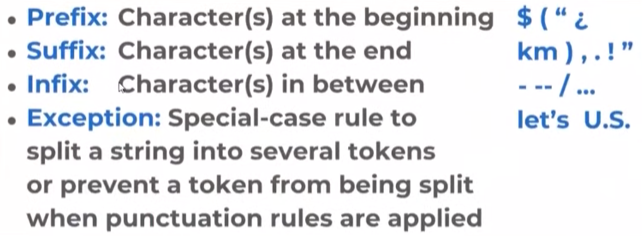

In [ ]:
text="Hi! What a surprise"
text.split()

['Hi!', 'What', 'a', 'surprise']

In [ ]:
text="My bike average running speed is 40km"
text.split()

['My', 'bike', 'average', 'running', 'speed', 'is', '40km']

In [ ]:
text="Hi! How are you? I am waiting for you"
text.split("?")

['Hi! How are you', ' I am waiting for you']

**Method 2: Regular Expression**

Word Tokenization

In [ ]:
import re
def token_re(text):
  tokens=re.findall("[\w']+", text)
  return tokens

In [ ]:
text="Hi! What a surprise"
token_re(text)

['Hi', 'What', 'a', 'surprise']

In [ ]:
text="My bike average running speed is 40km"
token_re(text)

['My', 'bike', 'average', 'running', 'speed', 'is', '40km']

Sentence Tokenization

In [ ]:
import re
def sent_token_re(text):
  sentences=re.compile('[!.?]').split(text)
  return sentences

In [ ]:
text="Hi! How are you? I am waiting for you. Currently, I am working in SRU"
sent_token_re(text)

['Hi',
 ' How are you',
 ' I am waiting for you',
 ' Currently',
 ' I am working in SRU']

**Method3 - NLTK**

In [ ]:
import nltk
nltk.download('punkt')
from nltk import word_tokenize, sent_tokenize

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
text="Hi I am Venkataramana"
word_tokenize(text)

['Hi', 'I', 'am', 'Venkataramana']

In [ ]:
text="Hi! How are you? I am waiting for you. Currently, I am working in SRU"
sent_tokenize(text)

['Hi!',
 'How are you?',
 'I am waiting for you.',
 'Currently, I am working in SRU']

In [ ]:
text1="I have Ph.D. in PowerSystems"
text2="We are here to help! mail me at v.venkataramana@sru.edu.in"
text3="A 5km ride cost is Rs.20"

In [ ]:
word_tokenize(text1)

['I', 'have', 'Ph.D.', 'in', 'PowerSystems']

In [ ]:
word_tokenize(text2)

['We',
 'are',
 'here',
 'to',
 'help',
 '!',
 'mail',
 'me',
 'at',
 'v.venkataramana',
 '@',
 'sru.edu.in']

In [ ]:
word_tokenize(text3)

['A', '5km', 'ride', 'cost', 'is', 'Rs.20']

**Method4 - Spac**y

In [ ]:
!pip install spacy -q
!python -m spacy download en_core_web_sm -q

2023-05-18 05:31:31.792206: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 37.8 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [ ]:
import spacy
nlp=spacy.load('en_core_web_sm')

In [ ]:
for token in nlp(text1):
  print(token) 

I
have
Ph.D.
in
PowerSystems


In [ ]:
for token in nlp(text2):
  print(token) 

We
are
here
to
help
!
mail
me
at
v.venkataramana@sru.edu.in


In [ ]:
for token in nlp(text3):
  print(token) 

A
5
km
ride
cost
is
Rs.20


**Stemming**

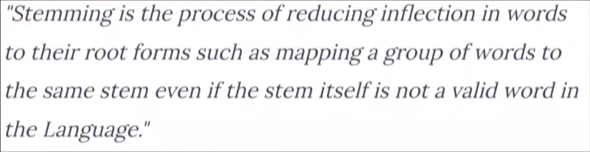

Errors in Stemming:

Over-Stemming: It occurs when two or more unrelated words result in the same stem.

Under-Stemming: It occurs when two or more related words result in different stems.

Stemmer Classification


1.   Porter Stemmer
2.   Snowball
3.   Lancaster.



# Porter Stemmer
It is one of the most commonly used stemmers, developed by M.F. Porter in 1980.

The entire porter algorithm is small and thus fast and simple.

The drawback of this stemmer is that it supports only the English language, and the stem obtained may or may not be linguistically correct.



In [ ]:
  import nltk
  from nltk.stem.porter import PorterStemmer

In [ ]:
def stem_words_port(text):
  ps=PorterStemmer()
  return " ".join(ps.stem(word) for word in text.split())

In [ ]:
text="Hi! How are you? I am waiting for you. Currently, I am working in SRU"

In [ ]:
stem_words(text)

'hi! how are you? i am wait for you. currently, i am work in sru'

In [ ]:
df['review']=df['review'].apply(stem_words_port)
df.head()

,review,sentiment
0,one of the other review ha mention that after ...,positive
1,a wonder littl production. <br /><br />the fil...,positive
2,i thought thi wa a wonder way to spend time on...,positive
3,basic there a famili where a littl boy (jake) ...,negative
4,"petter mattei ""love in the time of money"" is a...",positive


# Snowball  Stemmer

M.F. Porter also developed snowball stemmer.

It supports multiple languages, including English, Russian, Danish, French, Finnish, German, Italian, Hungarian, Portuguese, Norwegian, Swedish, and Spanish.

According to M.F. Porter, the stemming of stopwords like ‘being’ to ‘be’ is useless because they don’t have any shared meaning

**Snowball** provides another parameter called **ignore_stopwords**, which is set to **false by default**. If it is set to **true**, then snowball will not perform the stemming of stopwords.



In [ ]:
import nltk
from nltk.stem import SnowballStemmer

In [ ]:
def stem_words_snowball(text):
  sb=SnowballStemmer("english",)
  return " ".join(sb.stem(word) for word in text.split())

In [ ]:
text="Hi! How are you? I am waiting for you. Currently, I am working in SRU"

In [ ]:
stem_words_snowball(text)

'hi! how are you? i am wait for you. currently, i am work in sru'

In [ ]:
df['review']=df['review'].apply(stem_words_snowball)
df.head()

,review,sentiment
0,one of the other review has mention that after...,positive
1,a wonder littl production. <br /><br />the fil...,positive
2,i thought this was a wonder way to spend time ...,positive
3,basic there a famili where a littl boy (jake) ...,negative
4,"petter mattei ""love in the time of money"" is a...",positive


# Lancaster   Stemmer

Lancaster stemmer is also called Paice or Husk stemmer. It was developed by C.D. Paice at Lancaster University in 1990.

It uses an iterative approach, and this makes it the most aggressive algorithm among the three stemmers

Due to its iterative approach, it may lead to **over-stemming**, which may result in the linguistically incorrect roots. 

It is not as efficient as a porter or snowball stemmer. Also, it only **supports the English language**.

In [ ]:
import nltk
from nltk.stem.lancaster import LancasterStemmer

In [ ]:
def stem_words_Lancaster(text):
  ls=LancasterStemmer()
  return " ".join(ls.stem(word) for word in text.split())

In [ ]:
text="Hi! How are you? I am waiting for you. Currently, I am working in SRU"

In [ ]:
stem_words_Lancaster(text)

'hi! how ar you? i am wait for you. currently, i am work in sru'

In [ ]:
df['review']=df['review'].apply(stem_words_Lancaster)
df.head()

,review,sentiment
0,on of the oth review ha ment that aft watch ju...,positive
1,a wond littl production. <br /><br />the film ...,positive
2,i thought thi wa a wond way to spend tim on a ...,positive
3,bas ther a famil wher a littl boy (jake) think...,negative
4,"pet matte ""love in the tim of money"" is a vis ...",positive


**Lemmatization**

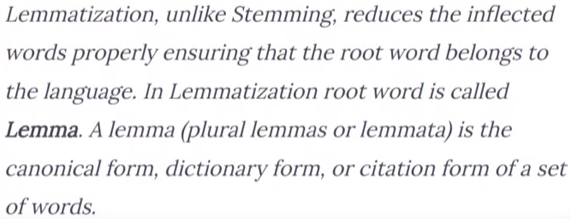


Stemming fast (It may not provide proper language word), Lemmatizatiuon slow as it search for word in WordNet dict

If you want to show output to user go for lemmatization, otherwise go for *stemming*

The root of a word in lemmatization is called **lemma**. So, for words like ‘run’, ‘runs’, ‘running’, or ‘ran’; ‘run’ is the lemma.

One of the most used lemmatizers is the WordNet which is provided by NLTK

To get the **precise lemma**, we must provide an appropriate **part of speech (pos) tag**. By **default**, every word is treated as a **noun (n)**. We’ll pass verb (v) as the value to the pos parameter for all the words in the list.

# **Summary on Stemming and Lemmatization**

First, should we choose stemming or lemmatization for the preprocessing step? It depends on the application that is being created. 


Stemming is fast compared to lemmatization. Also, stemming may or may not return a valid stem or root, whereas lemmatization will return a linguistically correct root. 


So, in applications where **speed matters**, like search and retrieval systems, **stemming** could be preferred; and in applications where **valid root matters**, like in **language modeling**, **lemmatization** could be preferred. 


Secondly, is stemming used only in IR systems? No. Stemming could be performed in text summarization or even in text categorization.

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
# import these modules
from nltk.stem import WordNetLemmatizer
 
lemmatizer = WordNetLemmatizer()
 
print("rocks :", lemmatizer.lemmatize("rocks"))
print("corpora :", lemmatizer.lemmatize("corpora"))
 
# a denotes adjective in "pos"
print("better :", lemmatizer.lemmatize("better", pos ="a"))

rocks : rock
corpora : corpus
better : good


In [ ]:
# import these modules
from nltk.stem import WordNetLemmatizer 
lemmatizer = WordNetLemmatizer()
text="Hi! How are you? I am waiting for you. Currently, I am working in SRU"
punctuation="!?.,'|;:"
words=nltk.word_tokenize(text)
for word in words:
  if word in punctuation:
    words.remove(word)
  
print("{0:20}{1:20}".format("Word","Lemma"))

for word in words:
  print("{0:20}{1:20}".format(word,lemmatizer.lemmatize(word, pos ="v"))) # default n:noun, but we can keep "a" for adjective and "v" for verb



Word                Lemma               
Hi                  Hi                  
How                 How                 
are                 be                  
you                 you                 
I                   I                   
am                  be                  
waiting             wait                
for                 for                 
you                 you                 
Currently           Currently           
I                   I                   
am                  be                  
working             work                
in                  in                  
SRU                 SRU                 


In [ ]:
def lemmatization(text):
  from nltk.stem import WordNetLemmatizer 
  lemmatizer = WordNetLemmatizer()
  return " ".join(lemmatizer.lemmatize(word, pos ="v") for word in text.split())

In [ ]:
text="Hi! How are you? I am waiting for you. Currently, I am working in SRU"

In [ ]:
lemmatization(text)

'Hi! How be you? I be wait for you. Currently, I be work in SRU'

In [ ]:
df['review']=df['review'].apply(lemmatization)
df.head()

,review,sentiment
0,on of the oth review ha ment that aft watch ju...,positive
1,a wond littl production. <br /><br />the film ...,positive
2,i think thi wa a wond way to spend tim on a to...,positive
3,bas ther a famil wher a littl boy (jake) think...,negative
4,"pet matte ""love in the tim of money"" be a vis ...",positive


# **Assignment - 02**



1.   Load TMDB data
2.   HTML tag Removal
3.   Remove URLs
4.   Handling Emojis
5.   Chat Word Treatment
6.   Remove Punctuations
7.   Data Lowercasing
8.   Removing stopwords
9.   Spelling Correction
10.   Tokenization
11.  Stemming
12.  Lemmatization






In [ ]:
import json
from urllib.request import urlopen
url="https://api.themoviedb.org/3/movie/top_rated?api_key=8265bd1679663a7ea12ac168da84d2e8&language=en-US&page=2"
# store the response of URL
response = urlopen(url)
# storing the JSON response 
# from url in data
data_json = json.loads(response.read())
# print the json response
print(data_json)

{'page': 2, 'results': [{'adult': False, 'backdrop_path': '/w2uGvCpMtvRqZg6waC1hvLyZoJa.jpg', 'genre_ids': [10749], 'id': 696374, 'original_language': 'en', 'original_title': "Gabriel's Inferno", 'overview': "An intriguing and sinful exploration of seduction, forbidden love, and redemption, Gabriel's Inferno is a captivating and wildly passionate tale of one man's escape from his own personal hell as he tries to earn the impossible--forgiveness and love.", 'popularity': 14.354, 'poster_path': '/oyG9TL7FcRP4EZ9Vid6uKzwdndz.jpg', 'release_date': '2020-05-29', 'title': "Gabriel's Inferno", 'video': False, 'vote_average': 8.5, 'vote_count': 2339}, {'adult': False, 'backdrop_path': '/wxaBkuqVIgImjRHEMJoxL9Lq6i8.jpg', 'genre_ids': [16, 10751, 12, 14], 'id': 995133, 'original_language': 'en', 'original_title': 'The Boy, the Mole, the Fox and the Horse', 'overview': 'The unlikely friendship of a boy, a mole, a fox and a horse traveling together in the boy’s search for home.', 'popularity': 21.

# **Load TMDB data**

In [ ]:
import pandas as pd
df = pd.read_json (r'https://api.themoviedb.org/3/movie/top_rated?api_key=8265bd1679663a7ea12ac168da84d2e8&language=en-US&page=2')
df.to_csv (r'movies.csv', index = None)

In [ ]:
import pandas as pd
df=pd.read_csv("/content/drive/MyDrive/AI Data/NLP Data/TMDB_Dataset.csv")
df.head()

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",10-12-2009,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",19-05-2007,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",26-10-2015,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...",http://www.thedarkknightrises.com/,49026,"[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",16-07-2012,1084939099,165.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,The Legend Ends,The Dark Knight Rises,7.6,9106
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://movies.disney.com/john-carter,49529,"[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",07-03-2012,284139100,132.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"Lost in our world, found in another.",John Carter,6.1,2124


In [ ]:
df["overview"].head()

0    In the 22nd century, a paraplegic Marine is di...
1    Captain Barbossa, long believed to be dead, ha...
2    A cryptic message from Bond’s past sends him o...
3    Following the death of District Attorney Harve...
4    John Carter is a war-weary, former military ca...
Name: overview, dtype: object

# **HTML tag Removal**

In [ ]:
import re
def remove_html_tag(text):
  pattern=re.compile('<.*?>')
  return pattern.sub(r'',str(text))

In [ ]:
df["overview"]=df["overview"].apply(remove_html_tag)
df["overview"].head()

0    In the 22nd century, a paraplegic Marine is di...
1    Captain Barbossa, long believed to be dead, ha...
2    A cryptic message from Bond’s past sends him o...
3    Following the death of District Attorney Harve...
4    John Carter is a war-weary, former military ca...
Name: overview, dtype: object

# **Remove URLs**

In [ ]:
import re
def remove_url(text):
  pattern=re.compile(r'https?://\S+|www\.\S+')
  return pattern.sub(r'',str(text))

In [ ]:
df['overview']=df['overview'].apply(remove_url)
df['overview'].head()

0    In the 22nd century, a paraplegic Marine is di...
1    Captain Barbossa, long believed to be dead, ha...
2    A cryptic message from Bond’s past sends him o...
3    Following the death of District Attorney Harve...
4    John Carter is a war-weary, former military ca...
Name: overview, dtype: object

# **Handling Emoji**

In [ ]:
!pip install emoji --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import emoji
def replace_emoji(text):
  text = emoji.demojize(text)
  return text

In [ ]:
df['overview']=df['overview'].apply(replace_emoji)
df['overview'].head()

0    In the 22nd century, a paraplegic Marine is di...
1    Captain Barbossa, long believed to be dead, ha...
2    A cryptic message from Bond’s past sends him o...
3    Following the death of District Attorney Harve...
4    John Carter is a war-weary, former military ca...
Name: overview, dtype: object

# **ChatWord Treatment**

In [ ]:
chat_words = {
'AFAIK':'As Far As I Know',
'AFK':'Away From Keyboard',
'ASAP':'As Soon As Possibl',
'ATK':'At The Keyboard',
'ATM':'At The Moment',
'A3':'Anytime, Anywhere, Anyplace',
'BAK':'Back At Keyboard',
'BBL':'Be Back Later',
'BBS':'Be Back Soon',
'BFN':'Bye For Now',
'B4N':'Bye For Now',
'BRB':'Be Right Back',
'BRT':'Be Right There',
'BTW':'By The Way',
'B4':'Before',
'B4N':'Bye For Now',
'CU':'See You',
'CUL8R':'See You Later',
'CYA':'See You',
'FAQ':'Frequently Asked Questions',
'FC':'Fingers Crossed',
'FWIW':'For What Its Worth',
'FYI':'For Your Information',
'GAL':'Get A Life',
'GG':'Good Game',
'GN':'Good Night',
'GMTA':'Great Minds Think Alike',
'GR8':'Great!',
'G9':'Genius',
'IC':'I See',
'ICQ':'I Seek you',
'ILU':'I Love You',
'IMHO':'In My Honest/Humble Opinion',
'IMO':'In My Opinion',
'IOW':'In Other Words',
'IRL':'In Real Life',
'KISS':'Keep It Simple, Stupid',
'LDR':'Long Distance Relationship',
'LMAO':'Laugh My A.. Off',
'LOL':'Laughing Out Loud',
'LTNS':'Long Time No See',
'L8R':'Later',
'MTE':'My Thoughts Exactly',
'M8':'Mate',
'NRN':'No Reply Necessary',
'OIC':'Oh I See',
'PITA':'Pain In The A..',
'PRT':'Party',
'PRW':'Parents Are Watching',
'ROFL':'Rolling On The Floor Laughing',
'ROFLOL':'Rolling On The Floor Laughing Out Loud',
'ROTFLMAO':'Rolling On The Floor Laughing My A.. Off',
'SK8':'Skate',
'STATS':'Your sex and age',
'ASL':'Age, Sex, Location',
'THX':'Thank You',
'TTFN':'Ta-Ta For Now!',
'TTYL':'Talk To You Later',
'U':'You',
'U2':'You Too',
'U4E':'Yours For Ever',
'WB':'Welcome Back',
'WTF':'What The F...',
'WTG':'Way To Go!',
'WUF':'Where Are You From?',
'W8':'Wait...'
}

In [ ]:
def chat_conversion(text):
  new_text=[]
  for w in text.split():
    if w.upper() in chat_words:
      new_text.append(chat_words[w.upper()])
    else:
      new_text.append(w)
  return " ".join(new_text)

In [ ]:
df['overview']=df['overview'].apply(chat_conversion)
df['overview'].head()

0    In the 22nd century, a paraplegic Marine is di...
1    Captain Barbossa, long believed to be dead, ha...
2    A cryptic message from Bond’s past sends him o...
3    Following the death of District Attorney Harve...
4    John Carter is a war-weary, former military ca...
Name: overview, dtype: object

# **Removal of Punctuations**

In [ ]:
import string,time
execlude=string.punctuation


def remove_punc_method2(text):
  return text.translate(str.maketrans('','',execlude))

In [ ]:
df['overview']=df['overview'].apply(remove_punc_method2)
df['overview'].head()

0    In the 22nd century a paraplegic Marine is dis...
1    Captain Barbossa long believed to be dead has ...
2    A cryptic message from Bond’s past sends him o...
3    Following the death of District Attorney Harve...
4    John Carter is a warweary former military capt...
Name: overview, dtype: object

# **Data LowerCasing**

In [ ]:
df['overview']=df['overview'].str.lower()
df['overview'].head()

0    in the 22nd century a paraplegic marine is dis...
1    captain barbossa long believed to be dead has ...
2    a cryptic message from bond’s past sends him o...
3    following the death of district attorney harve...
4    john carter is a warweary former military capt...
Name: overview, dtype: object

# **Stop Words Removal**

In [ ]:
import nltk
stop_words=nltk.download('stopwords') # a, an, the, am, is etc.
from nltk.corpus import stopwords
def Remove_Stopwords(text):
  new_text=[]
  for word in text.split():
    if word in stopwords.words('english'):
      new_text.append('')
    else:
      new_text.append(word)
  x=new_text[:]
  new_text.clear()
  return " ".join(x)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df['overview']=df['overview'].apply(Remove_Stopwords)
df['overview'].head()

0      22nd century  paraplegic marine  dispatched ...
1    captain barbossa long believed   dead  come ba...
2     cryptic message  bond’s past sends    trail  ...
3    following  death  district attorney harvey den...
4    john carter   warweary former military captain...
Name: overview, dtype: object

# **Spelling Correction**

In [ ]:
from textblob import TextBlob
def Spell_Correction(incorrect_text):
  text_blob = TextBlob(incorrect_text)
  return text_blob.correct().string

In [ ]:
df['overview']=df['overview'].apply(Spell_Correction)
df['overview'].head()  # Taking More Time

# **Stemming**

In [ ]:
import nltk
from nltk.stem import SnowballStemmer, PorterStemmer, LancasterStemmer

def stem_words_porter(text):
  ps=PorterStemmer("english",)
  return " ".join(ps.stem(word) for word in text.split())

def stem_words_snowball(text):
  sb=SnowballStemmer("english",)
  return " ".join(sb.stem(word) for word in text.split())

def stem_words_Lancast(text):
  ls=LancasterStemmer("english",)
  return " ".join(ls.stem(word) for word in text.split()) 

In [ ]:
df['overview']=df['overview'].apply(stem_words_snowball)
df['overview'].head()

0    22nd centuri parapleg marin dispatch moon pand...
1    captain barbossa long believ dead come back li...
2    cryptic messag bond past send trail uncov sini...
3    follow death district attorney harvey dent bat...
4    john carter warweari former militari captain w...
Name: overview, dtype: object

# **Tokenization**

In [ ]:
import nltk
nltk.download('punkt')
from nltk import word_tokenize, sent_tokenize
def tokenize(text):
  return word_tokenize(text)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
df1=df['overview'].apply(tokenize)
df1.head()  # Taking More Time

0    [22nd, centuri, parapleg, marin, dispatch, moo...
1    [captain, barbossa, long, believ, dead, come, ...
2    [cryptic, messag, bond, past, send, trail, unc...
3    [follow, death, district, attorney, harvey, de...
4    [john, carter, warweari, former, militari, cap...
Name: overview, dtype: object

# **Lemmatization**

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
def lemmatization(text):
  from nltk.stem import WordNetLemmatizer 
  lemmatizer = WordNetLemmatizer()
  return " ".join(lemmatizer.lemmatize(word, pos ="v") for word in text.split())

In [ ]:
df['overview']=df['overview'].apply(lemmatization)
df['overview'].head()

0    22nd centuri parapleg marin dispatch moon pand...
1    captain barbossa long believ dead come back li...
2    cryptic messag bond past send trail uncov sini...
3    follow death district attorney harvey dent bat...
4    john carter warweari former militari captain w...
Name: overview, dtype: object

# **End of The Assignment**

---



---



# **Text Representation**

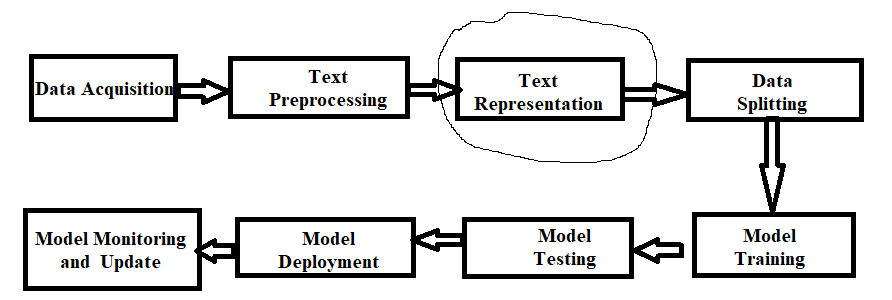

**Introduction**

Natural Language Processing is a branch of artificial intelligence that deals with human language to make a system able to understand and respond to language. 



Data being the most important part of any data science project should always be represented in a way that helps easy understanding and modeling, especially when it comes to NLP machine learning. 


It is said that when we provide very good features to bad models and bad features to well-optimized models then bad models will perform far better than an optimized model. 

So it is more important to study how features from text data can be extracted, and used in our NLP machine learning modeling process and why feature extraction from text is a bit difficult compared to other types of data

**what is Feature Extraction from the text?**

Feature Extraction is a general term that is also known as a text representation or text vectorization.

Which is a process of converting text into numbers. 

we call vectorization because when text is converted in numbers it is in vector form.

**Why do we need feature extraction?** 

Machines can only understand numbers and to make machines able to identify language we need to convert it into numeric form.

**Why Feature extraction from textual data is difficult?**

Images data can be converted in to numbers based pixel values, speech signal data can be converted in to numbers based on amplitude easily, but not in the case of text data.


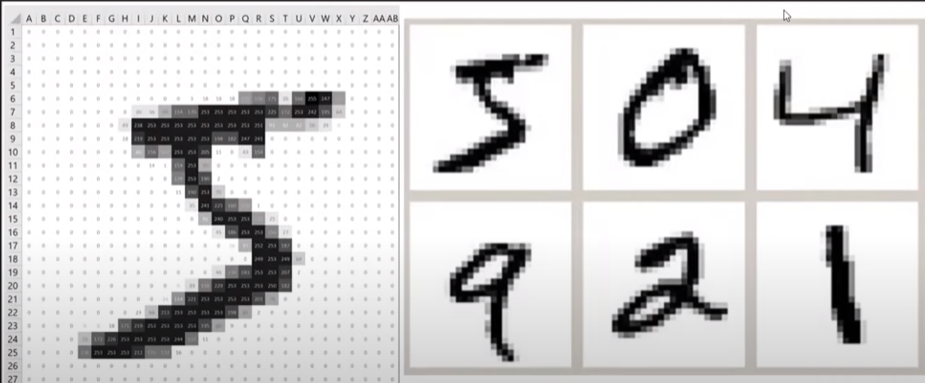


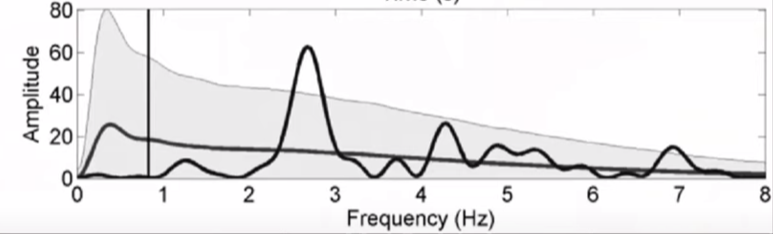




**What is the core Idea?**

When we convert text data in to numbers, the conversion must preserve the meaning of text

**What are the different NLP text vectorization techniques?**


1.   One-Hot Encoding
2.   Bag Of Words (BoW)
3.   N-Grams
4.   TF-IDF (Term Frequency and Inverse Document Frequency)
5.   Custom Features (Based on Domain Knowledge)
6.   Word2Vec (Embedding) : Used in Deep Learning



**Common Terms Used**

**Corpus(C)** : The total number of combinations of words in the whole dataset is known as Corpus. In simple words concatenating all the text records of the dataset forms a corpus.

**Vocabulary(V)** : a total number of distinct words which form your corpus is known as Vocabulary.

**Document(D)** : There are multiple records in a dataset so a single record or review is referred to as a document.

**Word(W)** : Words that are used in a document are known as Word.


# **One-Hot Encoding**

One hot encoding means converting words of your document in a V-dimension vector and by combining all this we get a single document so at the end we have a two-dimensional array. 


This technique is very intuitive means it is simple and you can code it yourself. This is only the advantage of One-Hot Encoding.

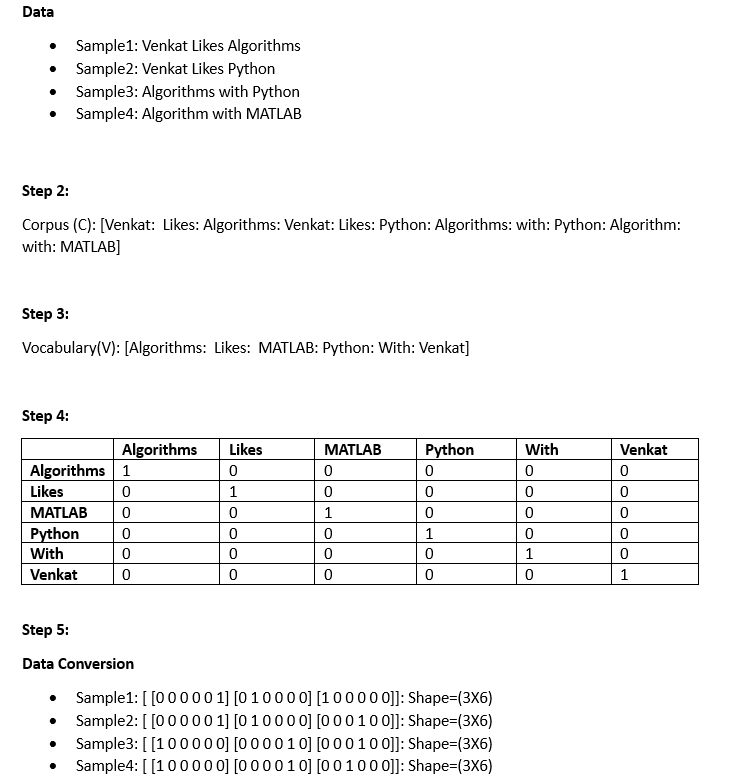

**Advantages**



*   very intuitive techniques
*   Easy to implemet


**Disadvantages**



*   **Sparsity** (Model will not train properly and overfit)
*   **No Fixed size** for each document (as no. of words in each document/record/  sample are different)
*   **Does not capture semantics** – The core idea is we have to convert text into numbers by keeping in mind that the actual meaning of a sentence should be observed in numbers that are not seen in one-hot encoding.

Example: [Walk, Run, Bottle] have same distance

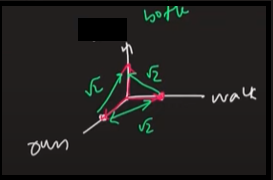


**Bag of Words (BoW)**

It is one of the most used text vectorization techniques. It is mostly used in text classification tasks.

Bag of words is a little bit similar to one-hot encoding where we enter each word as a binary value and in a Bag of words we keep a single row and entry the count of words in a document. So we create a vocabulary and for a single document, we enter one entry of which words occur how many times in a document.

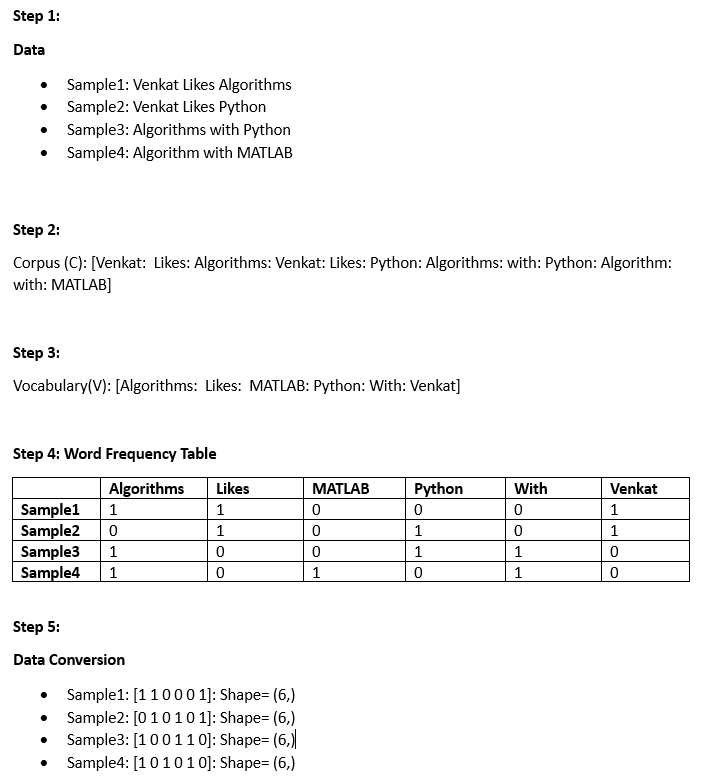

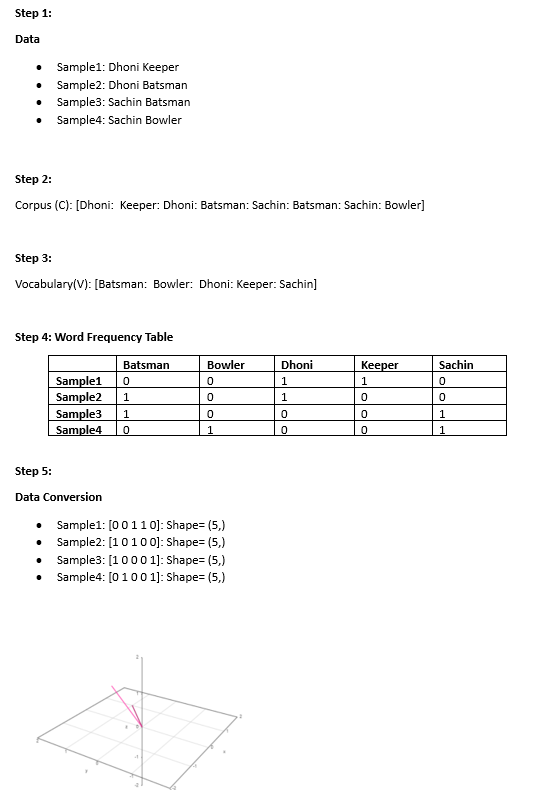

**Advantages**


1.   Fixed length of vocabulary
2.   Simple and Intutive


**Disadvantages**


1.   Sparsity
2.   Out of verb
3.   Ordering not considered
4.   Some times it fails to extract the internal meaning of statement


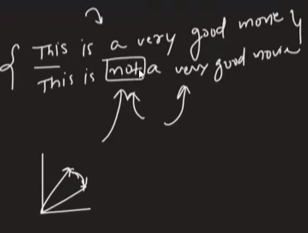



In [ ]:
import numpy as np
import pandas as pd
sentences = ['Author writes on Analytics Vidhya', 'Vidhya reads and writes comment on Analytics Vidhya', 'Vidhya appreciates author']
df = pd.DataFrame({"text":sentences, "output":[1,1,0]})
df.head()

,text,output
0,Author writes on Analytics Vidhya,1
1,Vidhya reads and writes comment on Analytics V...,1
2,Vidhya appreciates author,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
bow = cv.fit_transform(df['text'])

In [ ]:
cv.vocabulary_

{'author': 3,
 'writes': 8,
 'on': 5,
 'analytics': 0,
 'vidhya': 7,
 'reads': 6,
 'and': 1,
 'comment': 4,
 'appreciates': 2}

In [ ]:
print(bow[0].toarray())

[[1 0 0 1 0 1 0 1 1]]


In [ ]:
print(bow[1].toarray())

[[1 1 0 0 1 1 1 2 1]]


In [ ]:
print(bow[2].toarray())

[[0 0 1 1 0 0 0 1 0]]


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
def BoW(text):
  cv = CountVectorizer()
  return cv.fit_transform(text)

In [ ]:
ds = pd.read_csv('/content/drive/MyDrive/AI Data/NLP Data/SRU.csv', encoding='windows-1252')
ds['Comments in siksha'].head()

0    I am very satisfied with the college, and I re...
1                 Our college has good faculty members
2                     I am satisfied with this college
3                        Absolutely valuable for money
4    I am satisfied with this college because of it...
Name: Comments in siksha, dtype: object

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
bow = cv.fit_transform(ds['Comments in siksha'])

In [ ]:
bow[1].toarray()

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
        0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0]])

**Bag of N-Grams (N - Grams)**

bi-gram:   Two words for vocobulary

Tri-gram:   Three words for vocobulary

n-gram:  n words for vocobulary


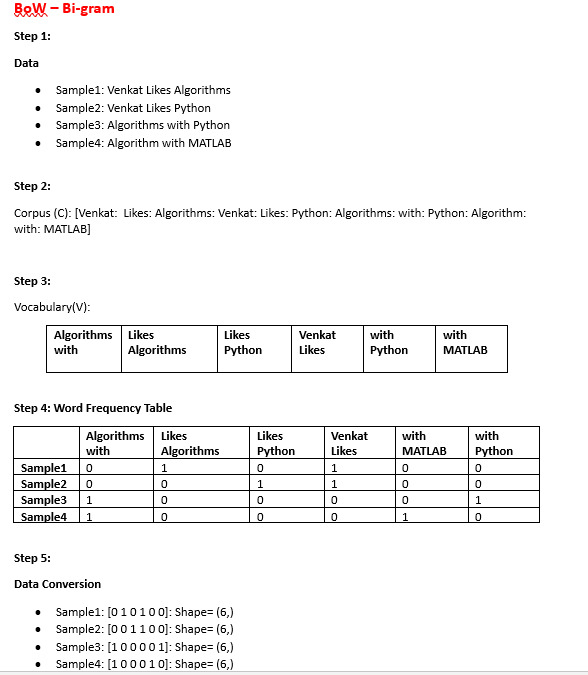

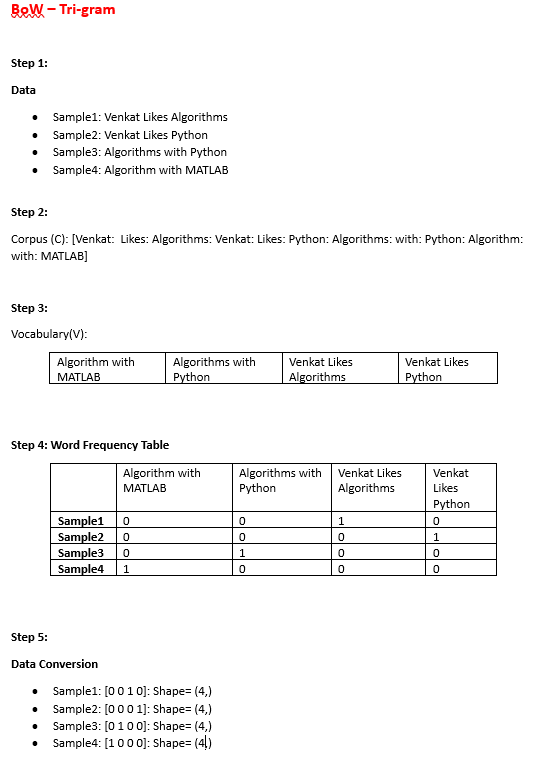

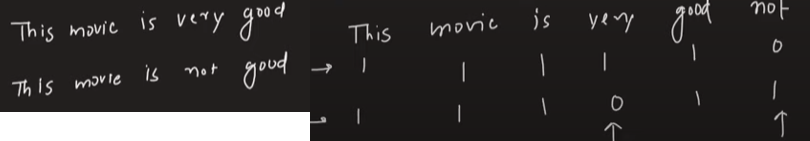

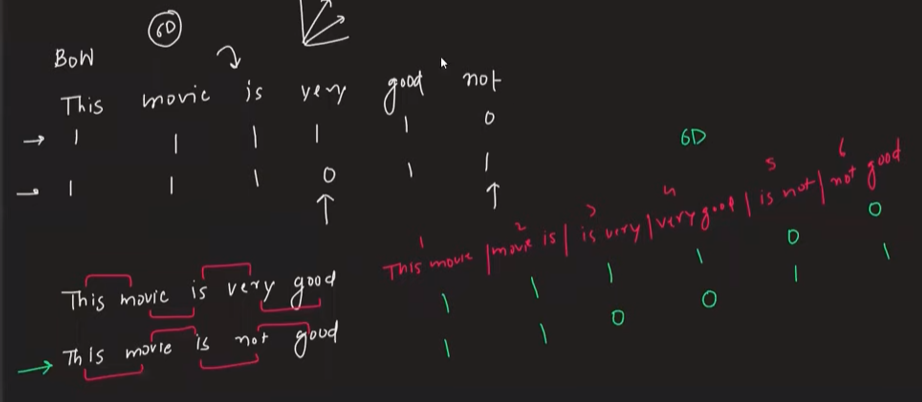

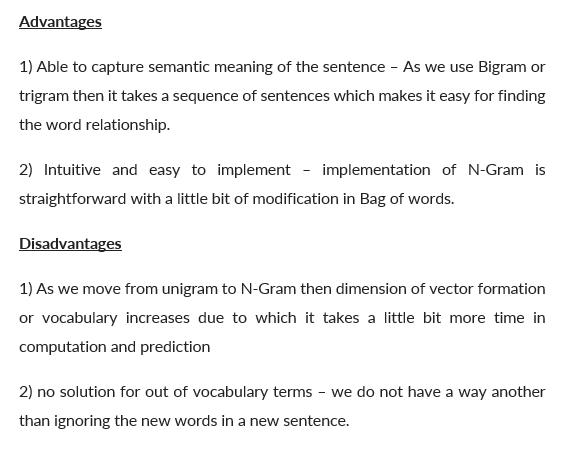

**Uni-Gram or BoW**

In [ ]:
import numpy as np
import pandas as pd
sentences = ['Venkat Likes Algorithms', 'Venkat Likes Python', 'Algorithms with Python','Algorithm with MATLAB']
df = pd.DataFrame({"text":sentences, "output":[1,1,0,0]})
df.head()

,text,output
0,Venkat Likes Algorithms,1
1,Venkat Likes Python,1
2,Algorithms with Python,0
3,Algorithm with MATLAB,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(1,1))
bow_uni = cv.fit_transform(df['text'])

In [ ]:
cv.vocabulary_

{'venkat': 5,
 'likes': 2,
 'algorithms': 1,
 'python': 4,
 'with': 6,
 'algorithm': 0,
 'matlab': 3}

In [ ]:
for i in range(4):
  print(bow_uni[i].toarray())

[[0 1 1 0 0 1 0]]
[[0 0 1 0 1 1 0]]
[[0 1 0 0 1 0 1]]
[[1 0 0 1 0 0 1]]


In [ ]:
import pandas as pd
ds = pd.read_csv('/content/drive/MyDrive/AI Data/NLP Data/SRU.csv', encoding='windows-1252')
ds['Comments in siksha'].head()

0    I am very satisfied with the college, and I re...
1                 Our college has good faculty members
2                     I am satisfied with this college
3                        Absolutely valuable for money
4    I am satisfied with this college because of it...
Name: Comments in siksha, dtype: object

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(1,1))
bow_uni = cv.fit_transform(ds['Comments in siksha'])

In [ ]:
cv.vocabulary_

{'am': 1,
 'very': 66,
 'satisfied': 51,
 'with': 71,
 'the': 57,
 'college': 11,
 'and': 2,
 'recommend': 47,
 'it': 30,
 'our': 43,
 'has': 27,
 'good': 26,
 'faculty': 20,
 'members': 35,
 'this': 59,
 'absolutely': 0,
 'valuable': 65,
 'for': 22,
 'money': 36,
 'because': 5,
 'of': 41,
 'its': 31,
 'course': 13,
 'placement': 45,
 'cell': 10,
 'works': 73,
 'benefit': 6,
 'students': 54,
 'just': 32,
 'but': 8,
 'not': 40,
 'too': 61,
 'much': 38,
 'dissatisfied': 16,
 'offers': 42,
 'courses': 14,
 'best': 7,
 'university': 63,
 'future': 24,
 'in': 29,
 'total': 62,
 'telangana': 56,
 'strict': 53,
 'rules': 50,
 'to': 60,
 'go': 25,
 'out': 44,
 'campus': 9,
 'we': 68,
 'need': 39,
 'friendly': 23,
 'relation': 49,
 'scenario': 52,
 'was': 67,
 'bad': 4,
 'year': 74,
 'compared': 12,
 'previous': 46,
 'don': 17,
 'have': 28,
 'more': 37,
 'events': 19,
 'disappoints': 15,
 'us': 64,
 'like': 34,
 'regulations': 48,
 'which': 69,
 'are': 3,
 'dont': 18,
 'labs': 33,
 'there': 58,

In [ ]:
len(cv.vocabulary_)

75

In [ ]:
for i in range(bow_uni.shape[0]):
  print(bow_uni[i].toarray())

**Bi-Gram**

In [ ]:
import numpy as np
import pandas as pd
sentences = ['Venkat Likes Algorithms', 'Venkat Likes Python', 'Algorithms with Python','Algorithm with MATLAB']
df = pd.DataFrame({"text":sentences, "output":[1,1,0,0]})
df.head()

,text,output
0,Venkat Likes Algorithms,1
1,Venkat Likes Python,1
2,Algorithms with Python,0
3,Algorithm with MATLAB,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(2,2))
bow_bi = cv.fit_transform(df['text'])

In [ ]:
cv.vocabulary_

{'venkat likes': 4,
 'likes algorithms': 2,
 'likes python': 3,
 'algorithms with': 1,
 'with python': 6,
 'algorithm with': 0,
 'with matlab': 5}

In [ ]:
for i in range(bow_bi.shape[0]):
  print(bow_bi[i].toarray())

[[0 0 1 0 1 0 0]]
[[0 0 0 1 1 0 0]]
[[0 1 0 0 0 0 1]]
[[1 0 0 0 0 1 0]]


In [ ]:
import pandas as pd
ds = pd.read_csv('/content/drive/MyDrive/AI Data/NLP Data/SRU.csv', encoding='windows-1252')
ds['Comments in siksha'].head()

0    I am very satisfied with the college, and I re...
1                 Our college has good faculty members
2                     I am satisfied with this college
3                        Absolutely valuable for money
4    I am satisfied with this college because of it...
Name: Comments in siksha, dtype: object

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(2,2))
bow_bi = cv.fit_transform(ds['Comments in siksha'])

In [ ]:
cv.vocabulary_

In [ ]:
len(cv.vocabulary_)

102

In [ ]:
for i in range(bow_bi.shape[0]):
  print(bow_bi[i].toarray())

**Tri-Gram**

In [ ]:
import numpy as np
import pandas as pd
sentences = ['Venkat Likes Algorithms', 'Venkat Likes Python', 'Algorithms with Python','Algorithm with MATLAB']
df = pd.DataFrame({"text":sentences, "output":[1,1,0,0]})
df.head()

,text,output
0,Venkat Likes Algorithms,1
1,Venkat Likes Python,1
2,Algorithms with Python,0
3,Algorithm with MATLAB,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(3,3))
bow_tri = cv.fit_transform(df['text'])

In [ ]:
cv.vocabulary_

{'venkat likes algorithms': 2,
 'venkat likes python': 3,
 'algorithms with python': 1,
 'algorithm with matlab': 0}

In [ ]:
for i in range(bow_tri.shape[0]):
  print(bow_tri[i].toarray())

[[0 0 1 0]]
[[0 0 0 1]]
[[0 1 0 0]]
[[1 0 0 0]]


In [ ]:
import pandas as pd
ds = pd.read_csv('/content/drive/MyDrive/AI Data/NLP Data/SRU.csv', encoding='windows-1252')
ds['Comments in siksha'].head()

0    I am very satisfied with the college, and I re...
1                 Our college has good faculty members
2                     I am satisfied with this college
3                        Absolutely valuable for money
4    I am satisfied with this college because of it...
Name: Comments in siksha, dtype: object

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(3,3))
bow_tri = cv.fit_transform(ds['Comments in siksha'])

In [ ]:
cv.vocabulary_

In [ ]:
len(cv.vocabulary_)

97

In [ ]:
for i in range(bow_tri.shape[0]):
  print(bow_tri[i].toarray())

**Uni-Gram and Bi-Gram**

In [ ]:
import numpy as np
import pandas as pd
sentences = ['Venkat Likes Algorithms', 'Venkat Likes Python', 'Algorithms with Python','Algorithm with MATLAB']
df = pd.DataFrame({"text":sentences, "output":[1,1,0,0]})
df.head()

,text,output
0,Venkat Likes Algorithms,1
1,Venkat Likes Python,1
2,Algorithms with Python,0
3,Algorithm with MATLAB,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(1,2))
bow_uni_bi = cv.fit_transform(df['text'])

In [ ]:
cv.vocabulary_

{'venkat': 9,
 'likes': 4,
 'algorithms': 2,
 'venkat likes': 10,
 'likes algorithms': 5,
 'python': 8,
 'likes python': 6,
 'with': 11,
 'algorithms with': 3,
 'with python': 13,
 'algorithm': 0,
 'matlab': 7,
 'algorithm with': 1,
 'with matlab': 12}

In [ ]:
len(cv.vocabulary_)

14

In [ ]:
for i in range(bow_uni_bi.shape[0]):
  print(bow_uni_bi[i].toarray())

[[0 0 1 0 1 1 0 0 0 1 1 0 0 0]]
[[0 0 0 0 1 0 1 0 1 1 1 0 0 0]]
[[0 0 1 1 0 0 0 0 1 0 0 1 0 1]]
[[1 1 0 0 0 0 0 1 0 0 0 1 1 0]]


**Uni-Gram and Bi-Gram and Tri-Gram**

In [ ]:
import numpy as np
import pandas as pd
sentences = ['Venkat Likes Algorithms', 'Venkat Likes Python', 'Algorithms with Python','Algorithm with MATLAB']
df = pd.DataFrame({"text":sentences, "output":[1,1,0,0]})
df.head()

,text,output
0,Venkat Likes Algorithms,1
1,Venkat Likes Python,1
2,Algorithms with Python,0
3,Algorithm with MATLAB,0


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(1,3))
bow_uni_bi_Tri = cv.fit_transform(df['text'])

In [ ]:
cv.vocabulary_

{'venkat': 11,
 'likes': 6,
 'algorithms': 3,
 'venkat likes': 12,
 'likes algorithms': 7,
 'venkat likes algorithms': 13,
 'python': 10,
 'likes python': 8,
 'venkat likes python': 14,
 'with': 15,
 'algorithms with': 4,
 'with python': 17,
 'algorithms with python': 5,
 'algorithm': 0,
 'matlab': 9,
 'algorithm with': 1,
 'with matlab': 16,
 'algorithm with matlab': 2}

In [ ]:
len(cv.vocabulary_)

18

In [ ]:
for i in range(bow_uni_bi_Tri.shape[0]):
  print(bow_uni_bi_Tri[i].toarray())

[[0 0 0 1 0 0 1 1 0 0 0 1 1 1 0 0 0 0]]
[[0 0 0 0 0 0 1 0 1 0 1 1 1 0 1 0 0 0]]
[[0 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 1]]
[[1 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0]]


## **TF-IDF (Term Frequency and Inverse Document Frequency)**

This technique gives different values(weightage) to each word in a document.

The core idea of assigning weightage is the word that appears multiple time in a document but has a rare appearance in corpus then it is very important for that document so it gives more weightage to that word.

This weightage is calculated by two terms known as **TF and IDF**. So for finding the **weightage of any word** we find **TF and IDF and multiply both** the terms.



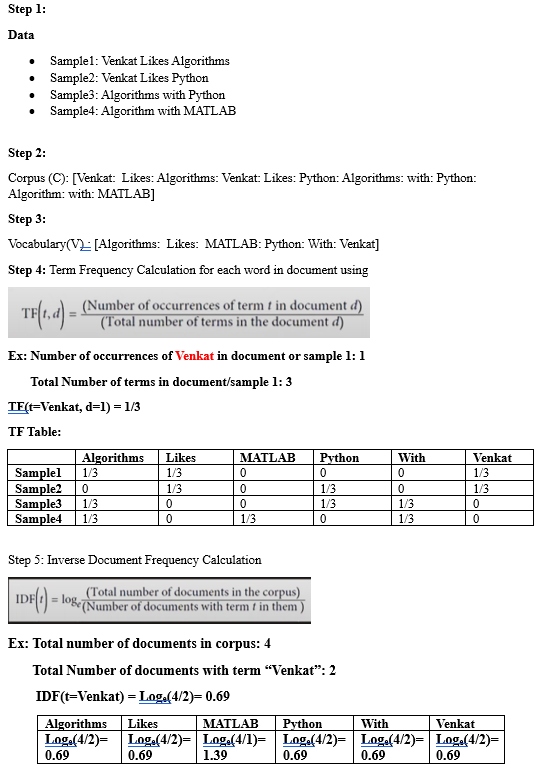

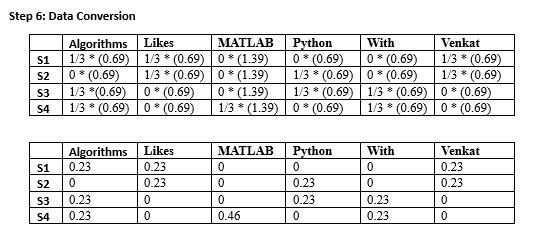

**Advantages**



*   Sutbale and effecient for Information Retrival


**Disadvantages**



*   Sparsity
*   Out of vector
*   Semantic meaning not extracted (She is beautiful, She is gorgeous will be trated as different meaning)
*   More dimenstions may lead overfitting|



In [ ]:
import numpy as np
import pandas as pd
sentences = ['Venkat Likes Algorithms', 'Venkat Likes Python', 'Algorithms with Python','Algorithms with MATLAB']
df = pd.DataFrame({"text":sentences, "output":[1,1,0,0]})
df.head()

,text,output
0,Venkat Likes Algorithms,1
1,Venkat Likes Python,1
2,Algorithms with Python,0
3,Algorithms with MATLAB,0


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
data=tfidf.fit_transform(df['text']).toarray()

In [ ]:
for i in range(data.shape[0]):
  print(data[i])

[0.49681612 0.61366674 0.         0.         0.61366674 0.        ]
[0.         0.57735027 0.         0.57735027 0.57735027 0.        ]
[0.49681612 0.         0.         0.61366674 0.         0.61366674]
[0.44809973 0.         0.70203482 0.         0.         0.55349232]


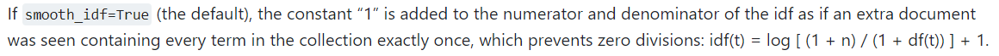

In [ ]:
print(tfidf.idf_)

[1.22314355 1.51082562 1.91629073 1.51082562 1.51082562 1.51082562]


In [ ]:
print(tfidf.get_feature_names_out())

['algorithms' 'likes' 'matlab' 'python' 'venkat' 'with']


In [ ]:
import pandas as pd
ds = pd.read_csv('/content/drive/MyDrive/AI Data/NLP Data/SRU.csv', encoding='windows-1252')
ds['Comments in siksha'].head()

0    I am very satisfied with the college, and I re...
1                 Our college has good faculty members
2                     I am satisfied with this college
3                        Absolutely valuable for money
4    I am satisfied with this college because of it...
Name: Comments in siksha, dtype: object

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
data=tfidf.fit_transform(ds['Comments in siksha']).toarray()

In [ ]:
for i in range(data.shape[0]):
  print(data[i])

**Custom Feature Extraction**

If you are working on sentiment analysis, considering #positive words #negative words etc.

# **Assignment-3**



*   Perform all necessary text preprocessing techniques on IMDB data
*   Perform all text represenation techniques on IMDB processed data



Load IMDB data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
df=pd.read_csv("/content/drive/MyDrive/AI Data/NLP Data/IMDB Dataset.csv")
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


1.   Load IMDB data
2.   HTML tag Removal
3.   Remove URLs
4.   Handling Emojis
5.   Chat Word Treatment
6.   Remove Punctuations
7.   Data Lowercasing
8.   Removing stopwords
9.   Spelling Correction
10.   Tokenization
11.  Stemming
12.  Lemmatization

**HTML tag Removal**

In [ ]:
import re
def remove_html_tag(text):
  pattern=re.compile('<.*?>')
  return pattern.sub(r'',str(text))

In [ ]:
df['review']=df['review'].apply(remove_html_tag)
df['review'].head()

0    One of the other reviewers has mentioned that ...
1    A wonderful little production. The filming tec...
2    I thought this was a wonderful way to spend ti...
3    Basically there's a family where a little boy ...
4    Petter Mattei's "Love in the Time of Money" is...
Name: review, dtype: object

**Remove URLs**

In [ ]:
import re
def remove_url(text):
  pattern=re.compile(r'https?://\S+|www\.\S+')
  return pattern.sub(r'',str(text))

In [ ]:
df['review']=df['review'].apply(remove_url)
df['review'].head()

0    One of the other reviewers has mentioned that ...
1    A wonderful little production. The filming tec...
2    I thought this was a wonderful way to spend ti...
3    Basically there's a family where a little boy ...
4    Petter Mattei's "Love in the Time of Money" is...
Name: review, dtype: object

**Handling Emojis**

In [ ]:
!pip install emoji --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import emoji
def replace_emoji(text):
  text = emoji.demojize(text)
  return text

In [ ]:
df['review']=df['review'].apply(replace_emoji)
df['review'].head()

0    One of the other reviewers has mentioned that ...
1    A wonderful little production. The filming tec...
2    I thought this was a wonderful way to spend ti...
3    Basically there's a family where a little boy ...
4    Petter Mattei's "Love in the Time of Money" is...
Name: review, dtype: object

**Chat Word Treatment**

In [ ]:
chat_words = {
'AFAIK':'As Far As I Know',
'AFK':'Away From Keyboard',
'ASAP':'As Soon As Possibl',
'ATK':'At The Keyboard',
'ATM':'At The Moment',
'A3':'Anytime, Anywhere, Anyplace',
'BAK':'Back At Keyboard',
'BBL':'Be Back Later',
'BBS':'Be Back Soon',
'BFN':'Bye For Now',
'B4N':'Bye For Now',
'BRB':'Be Right Back',
'BRT':'Be Right There',
'BTW':'By The Way',
'B4':'Before',
'B4N':'Bye For Now',
'CU':'See You',
'CUL8R':'See You Later',
'CYA':'See You',
'FAQ':'Frequently Asked Questions',
'FC':'Fingers Crossed',
'FWIW':'For What Its Worth',
'FYI':'For Your Information',
'GAL':'Get A Life',
'GG':'Good Game',
'GN':'Good Night',
'GMTA':'Great Minds Think Alike',
'GR8':'Great!',
'G9':'Genius',
'IC':'I See',
'ICQ':'I Seek you',
'ILU':'I Love You',
'IMHO':'In My Honest/Humble Opinion',
'IMO':'In My Opinion',
'IOW':'In Other Words',
'IRL':'In Real Life',
'KISS':'Keep It Simple, Stupid',
'LDR':'Long Distance Relationship',
'LMAO':'Laugh My A.. Off',
'LOL':'Laughing Out Loud',
'LTNS':'Long Time No See',
'L8R':'Later',
'MTE':'My Thoughts Exactly',
'M8':'Mate',
'NRN':'No Reply Necessary',
'OIC':'Oh I See',
'PITA':'Pain In The A..',
'PRT':'Party',
'PRW':'Parents Are Watching',
'ROFL':'Rolling On The Floor Laughing',
'ROFLOL':'Rolling On The Floor Laughing Out Loud',
'ROTFLMAO':'Rolling On The Floor Laughing My A.. Off',
'SK8':'Skate',
'STATS':'Your sex and age',
'ASL':'Age, Sex, Location',
'THX':'Thank You',
'TTFN':'Ta-Ta For Now!',
'TTYL':'Talk To You Later',
'U':'You',
'U2':'You Too',
'U4E':'Yours For Ever',
'WB':'Welcome Back',
'WTF':'What The F...',
'WTG':'Way To Go!',
'WUF':'Where Are You From?',
'W8':'Wait...'
}

In [ ]:
def chat_conversion(text):
  new_text=[]
  for w in text.split():
    if w.upper() in chat_words:
      new_text.append(chat_words[w.upper()])
    else:
      new_text.append(w)
  return " ".join(new_text)

In [ ]:
df['review']=df['review'].apply(chat_conversion)
df['review'].head()

0    One of the other reviewers has mentioned that ...
1    A wonderful little production. The filming tec...
2    I thought this was a wonderful way to spend ti...
3    Basically there's a family where a little boy ...
4    Petter Mattei's "Love in the Time of Money" is...
Name: review, dtype: object

**Remove Punctuations**

In [ ]:
import string,time
execlude=string.punctuation


def remove_punc_method2(text):
  return text.translate(str.maketrans('','',execlude))

In [ ]:
df['review']=df['review'].apply(remove_punc_method2)
df['review'].head()

0    One of the other reviewers has mentioned that ...
1    A wonderful little production The filming tech...
2    I thought this was a wonderful way to spend ti...
3    Basically theres a family where a little boy J...
4    Petter Matteis Love in the Time of Money is a ...
Name: review, dtype: object

**Data Lowercasing**

In [ ]:
df['review']=df['review'].str.lower()
df['review'].head()

0    one of the other reviewers has mentioned that ...
1    a wonderful little production the filming tech...
2    i thought this was a wonderful way to spend ti...
3    basically theres a family where a little boy j...
4    petter matteis love in the time of money is a ...
Name: review, dtype: object

Removing stopwords

In [ ]:
import nltk
stop_words=nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
import nltk
stop_words=nltk.download('stopwords') # a, an, the, am, is etc.
from nltk.corpus import stopwords
def Remove_Stopwords(text):
  new_text=[]
  for word in text.split():
    if word in stopwords.words('english'):
      new_text.append('')
    else:
      new_text.append(word)
  x=new_text[:]
  new_text.clear()
  return " ".join(x)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
df['review']=df['review'].apply(Remove_Stopwords)
df['review'].head()

**Spelling Correction**

In [ ]:
from textblob import TextBlob
def Spell_Correction(incorrect_text):
  text_blob = TextBlob(incorrect_text)
  return text_blob.correct().string

In [ ]:
df['review']=df['review'].apply(Spell_Correction)
df['review'].head()

**Lemmatization**

In [ ]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
def lemmatization(text):
  from nltk.stem import WordNetLemmatizer 
  lemmatizer = WordNetLemmatizer()
  return " ".join(lemmatizer.lemmatize(word, pos ="v") for word in text.split())

In [ ]:
df['review']=df['review'].apply(lemmatization)
df['review'].head()

0    one of the other reviewers have mention that a...
1    a wonderful little production the film techniq...
2    i think this be a wonderful way to spend time ...
3    basically theres a family where a little boy j...
4    petter matteis love in the time of money be a ...
Name: review, dtype: object

**Perform all text represenation techniques on IMDB processed data**

Find Total number of words in corpus usiong python

In [ ]:
count=0
for i in range(len(df['review'])):
  count=count+len(df['review'][i].split())

print("No. of words in corpus=",count)


No. of words in corpus= 5993042


Find Total number of words in vocobulary using python

In [ ]:
voc=[]
for i in range(len(df['review'])):
  for word in df['review'][i].split():
    if word not in voc:
      voc.append(word)
Print("No. of words in vocobulary=",len(voc))


**One Hot Encoding**

In [ ]:
corpus = [
    "The elephant sneezed at the sight of potatoes.",
    "Bats can see via echolocation. See the bat sight sneeze!",
    "Wondering, she opened the door to the studio.",
]
corpus

['The elephant sneezed at the sight of potatoes.',
 'Bats can see via echolocation. See the bat sight sneeze!',
 'Wondering, she opened the door to the studio.']

In [ ]:
voc=[]
for i in range(len(corpus)):
  for word in corpus[i].split():
    if word not in voc:
      voc.append(word.lower())
print("No. of words in vocobulary=",len(voc))

No. of words in vocobulary= 21


In [ ]:
voc.sort()
voc

['at',
 'bat',
 'bats',
 'can',
 'door',
 'echolocation.',
 'elephant',
 'of',
 'opened',
 'potatoes.',
 'see',
 'see',
 'she',
 'sight',
 'sneeze!',
 'sneezed',
 'studio.',
 'the',
 'to',
 'via',
 'wondering,']

In [ ]:
import numpy as np
one_hot=np.zeros((len(corpus),int(len(voc))))
one_hot

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0.]])

In [ ]:
for i in range(len(corpus)):
  for word in corpus[i].split():
    index = voc.index(word.lower())
    one_hot[i][index]=1
one_hot

array([[1., 0., 0., 0., 0., 0., 1., 1., 0., 1., 0., 0., 0., 1., 0., 1.,
        0., 1., 0., 0., 0.],
       [0., 1., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0.,
        0., 1., 0., 1., 0.],
       [0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0.,
        1., 1., 1., 0., 1.]])

**bag of Words**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer()
bow = cv.fit_transform(df['review'])

In [ ]:
for i in range(5):
  print(bow[i].toarray())

[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [ ]:
len(cv.vocabulary_)

208104

In [ ]:
for word in cv.vocabulary_:
  count=0;
  for i in range(len(df['review'])):
    for j in df['review'][i].split():
      if(word == j):
        count=count+1
  print("no. of occurance of", word, count )

**Bag of bi gram**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(2,2))
bow = cv.fit_transform(df['review'])

In [ ]:
for i in range(5):
  print(bow[i].toarray())

[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [ ]:
len(cv.vocabulary_)

2954037

In [ ]:
bow.shape

(50000, 2954037)

**Bag of Tri gram**

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(ngram_range=(3,3))
bow = cv.fit_transform(df['review'])

In [ ]:
for i in range(5):
  print(bow[i].toarray())

[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [ ]:
len(cv.vocabulary_)

5379693

In [ ]:
bow.shape

(50000, 5379693)

**TF-IDF**

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer()
data=tfidf.fit_transform(df['review']).toarray()

In [ ]:
df['review']

0        One of the other reviewers has mentioned that ...
1        A wonderful little production. <br /><br />The...
2        I thought this was a wonderful way to spend ti...
3        Basically there's a family where a little boy ...
4        Petter Mattei's "Love in the Time of Money" is...
                               ...                        
49995    I thought this movie did a down right good job...
49996    Bad plot, bad dialogue, bad acting, idiotic di...
49997    I am a Catholic taught in parochial elementary...
49998    I'm going to have to disagree with the previou...
49999    No one expects the Star Trek movies to be high...
Name: review, Length: 50000, dtype: object

In [ ]:
for i in range(data.shape[0]):
  print(data[i])

In [ ]:
print(tfidf.idf_)

In [ ]:
print(tfidf.get_feature_names_out())

# **Text Representation Using Word2Vec**

**What mean bt WordEmbedding**


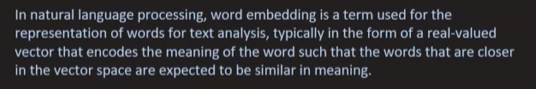

**Why Word Embedding is required?**

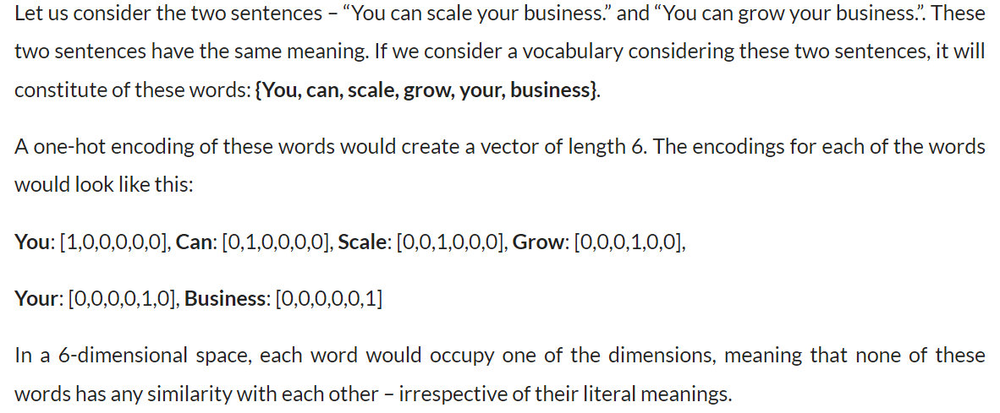

Word2Vec, a word embedding methodology, solves this issue and enables similar words to have similar dimensions and, consequently, helps bring context

**Word Embedding Classification**

*   Frequency Based (BoW, TF-IDF, Glove, Matrix Fromulization)
*   Prediction Based (Word2Vec: Deep Learning Based approach)




**What is Word2Vec?**

Word2Vec creates vectors of the words that are distributed numerical representations of word features – these word features could comprise of words that represent the context of the individual words present in our vocabulary. Word embeddings eventually help in establishing the association of a word with another similar meaning word through the created vectors.


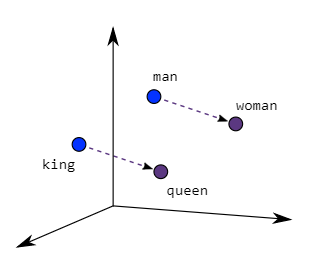

**Advantages**



*   Semantic Meaning
*   Low Dimensional Space (100 - 300): In case on Bow It is more than 10000.  
    Hence Less computation power and time
*   Dense vector (No Sparsity), Hence no overfitting problem


**Word2Vec Classification**



*   Pre-Trained (Google New corpus, 30,00,000 words, conerts into 300 length vector)
*   Self Trained 




**Pretrained Model based Word2Vec**

In [ ]:
import gensim
from gensim.models import Word2Vec,KeyedVectors

In [ ]:
import wget
model = KeyedVectors.load_word2vec_format('/content/drive/MyDrive/AI Data/NLP Data/GoogleNews-vectors-negative300.bin',binary=True,limit=500000)

In [ ]:
model['cricket']

In [ ]:
model.most_similar('man')

[('woman', 0.7664012908935547),
 ('boy', 0.6824871301651001),
 ('teenager', 0.6586930155754089),
 ('teenage_girl', 0.6147903203964233),
 ('girl', 0.5921714305877686),
 ('robber', 0.5585119128227234),
 ('Robbery_suspect', 0.5584409832954407),
 ('teen_ager', 0.5549196600914001),
 ('men', 0.5489763021469116),
 ('guy', 0.5420035123825073)]

In [ ]:
model.most_similar('cricket')

[('cricketing', 0.8372225761413574),
 ('cricketers', 0.8165745735168457),
 ('Test_cricket', 0.8094819188117981),
 ('Twenty##_cricket', 0.8068488240242004),
 ('Twenty##', 0.7624265551567078),
 ('Cricket', 0.75413978099823),
 ('cricketer', 0.7372578382492065),
 ('twenty##', 0.7316356897354126),
 ('T##_cricket', 0.7304614186286926),
 ('West_Indies_cricket', 0.6987985968589783)]

In [ ]:
model.most_similar('facebook')

[('Facebook', 0.7563533186912537),
 ('FaceBook', 0.7076998949050903),
 ('twitter', 0.6988552212715149),
 ('myspace', 0.6941817998886108),
 ('Twitter', 0.664244532585144),
 ('Facebook.com', 0.6529868245124817),
 ('FacebookFacebook', 0.6162722110748291),
 ('facebook.com', 0.6135972142219543),
 ('Twitter.com', 0.6102108359336853),
 ('TwitterTwitter', 0.6085205674171448)]

In [ ]:
model.similarity('man','woman')

0.76640123

In [ ]:
model.similarity('man','PHP')

-0.032995153

In [ ]:
model.doesnt_match(['PHP','java','monkey'])

'monkey'

In [ ]:
vec = model['king'] - model['man'] + model['woman']
model.most_similar([vec])

[('king', 0.8449392318725586),
 ('queen', 0.7300517559051514),
 ('monarch', 0.645466148853302),
 ('princess', 0.6156251430511475),
 ('crown_prince', 0.5818676352500916),
 ('prince', 0.5777117609977722),
 ('kings', 0.5613663792610168),
 ('sultan', 0.5376775860786438),
 ('queens', 0.5289887189865112),
 ('ruler', 0.5247419476509094)]

In [ ]:
vec = model['INR'] - model['India'] + model['England']
model.most_similar([vec])

[('INR', 0.6442341208457947),
 ('GBP', 0.5040826797485352),
 ('England', 0.44649264216423035),
 ('£', 0.43340998888015747),
 ('Â_£', 0.4307197630405426),
 ('£_#.##m', 0.42561301589012146),
 ('Pounds_Sterling', 0.42512619495391846),
 ('GBP##', 0.42464491724967957),
 ('stg', 0.42324796319007874),
 ('£_#.###m', 0.4201711118221283)]

In [ ]:
import gensim.downloader as api

wv = api.load('word2vec-google-news-300')

vec_king = wv['king']

[=================================================-] 100.0% 1662.6/1662.8MB downloaded


In [ ]:
wv['cricket']

In [ ]:
wv.most_similar('man')

[('woman', 0.7664012908935547),
 ('boy', 0.6824871301651001),
 ('teenager', 0.6586930155754089),
 ('teenage_girl', 0.6147903203964233),
 ('girl', 0.5921714305877686),
 ('suspected_purse_snatcher', 0.571636438369751),
 ('robber', 0.5585119128227234),
 ('Robbery_suspect', 0.5584409832954407),
 ('teen_ager', 0.5549196600914001),
 ('men', 0.5489763021469116)]

In [ ]:
wv.most_similar('cricket')

[('cricketing', 0.8372225761413574),
 ('cricketers', 0.8165745735168457),
 ('Test_cricket', 0.8094819188117981),
 ('Twenty##_cricket', 0.8068488240242004),
 ('Twenty##', 0.7624265551567078),
 ('Cricket', 0.75413978099823),
 ('cricketer', 0.7372578382492065),
 ('twenty##', 0.7316356897354126),
 ('T##_cricket', 0.7304614186286926),
 ('West_Indies_cricket', 0.6987985968589783)]

In [ ]:
wv.most_similar('facebook')

[('Facebook', 0.7563533186912537),
 ('FaceBook', 0.7076998949050903),
 ('twitter', 0.6988552212715149),
 ('myspace', 0.6941817998886108),
 ('Twitter', 0.664244532585144),
 ('twitter_facebook', 0.6572229862213135),
 ('Facebook.com', 0.6529868245124817),
 ('myspace_facebook', 0.6370643973350525),
 ('facebook_twitter', 0.6367618441581726),
 ('linkedin', 0.6356592774391174)]

In [ ]:
wv.similarity('man','woman')

0.76640123

In [ ]:
wv.similarity('man','PHP')

-0.032995153

In [ ]:
wv.doesnt_match(['PHP','java','monkey'])

'monkey'

In [ ]:
vec = wv['king'] - wv['man'] + wv['woman']
wv.most_similar([vec])

[('king', 0.8449392318725586),
 ('queen', 0.7300517559051514),
 ('monarch', 0.645466148853302),
 ('princess', 0.6156251430511475),
 ('crown_prince', 0.5818676352500916),
 ('prince', 0.5777117609977722),
 ('kings', 0.5613663792610168),
 ('sultan', 0.5376775860786438),
 ('Queen_Consort', 0.5344247817993164),
 ('queens', 0.5289887189865112)]

In [ ]:
vec = wv['INR'] - wv ['India'] + wv['England']
wv.most_similar([vec])

[('INR', 0.6442341208457947),
 ('GBP', 0.5040826797485352),
 ('£_##.###m', 0.4540838301181793),
 ('England', 0.44649264216423035),
 ('£', 0.43340998888015747),
 ('Â_£', 0.4307197630405426),
 ('stg###', 0.4299262464046478),
 ('£_#.##m', 0.42561301589012146),
 ('Pounds_Sterling', 0.42512619495391846),
 ('GBP##', 0.42464491724967957)]

**The Illustrated Word2vec**

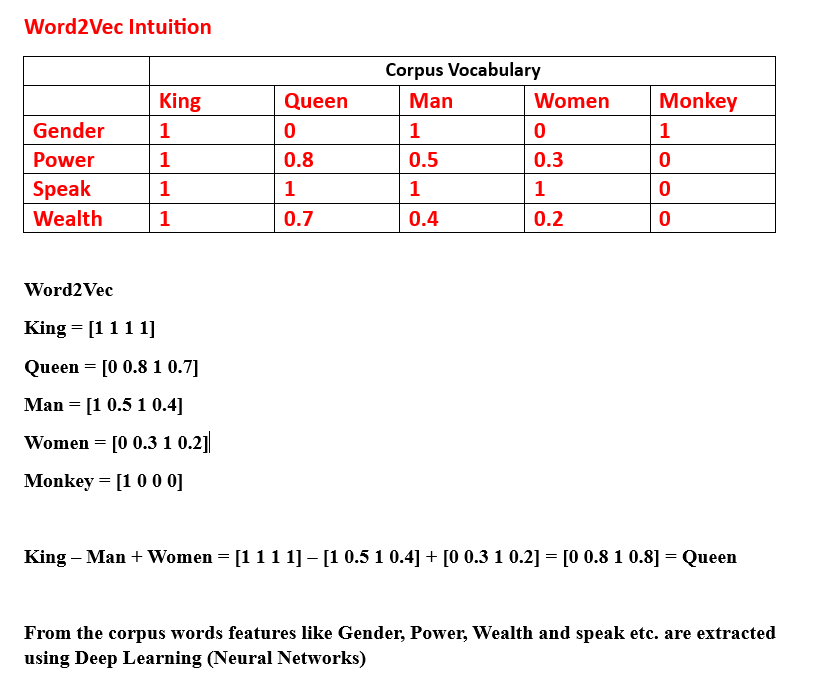

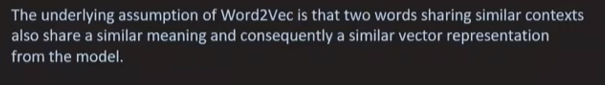

Ex: 

1.   The **football** player took a shot
2.   The **hockey** player took a shot



[http://jalammar.github.io/illustrated-word2vec/](http://jalammar.github.io/illustrated-word2vec/)

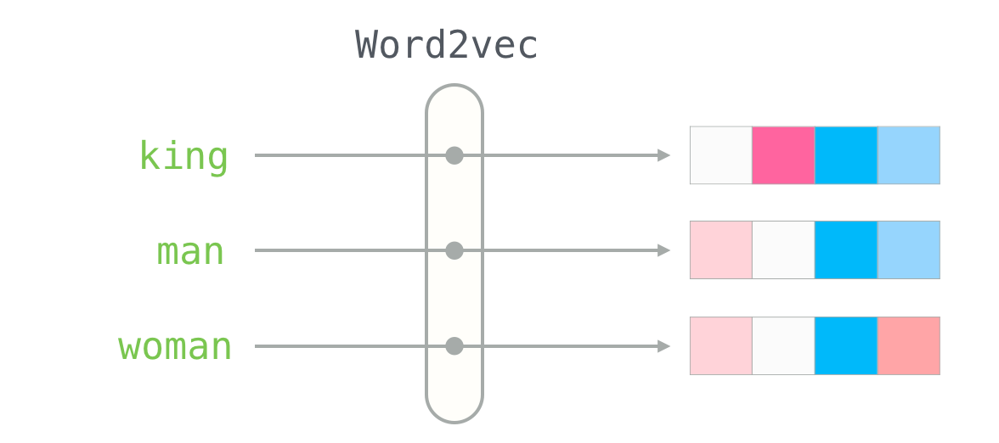

This is a word embedding for the word “king” (GloVe vector trained on Wikipedia):

[ 0.50451 , 0.68607 , -0.59517 , -0.022801, 0.60046 , -0.13498 , -0.08813 , 0.47377 , -0.61798 , -0.31012 , -0.076666, 1.493 , -0.034189, -0.98173 , 0.68229 , 0.81722 , -0.51874 , -0.31503 , -0.55809 , 0.66421 , 0.1961 , -0.13495 , -0.11476 , -0.30344 , 0.41177 , -2.223 , -1.0756 , -1.0783 , -0.34354 , 0.33505 , 1.9927 , -0.04234 , -0.64319 , 0.71125 , 0.49159 , 0.16754 , 0.34344 , -0.25663 , -0.8523 , 0.1661 , 0.40102 , 1.1685 , -1.0137 , -0.21585 , -0.15155 , 0.78321 , -0.91241 , -1.6106 , -0.64426 , -0.51042 ]

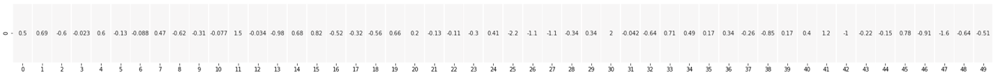

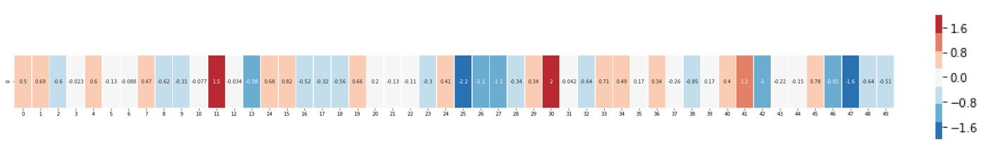

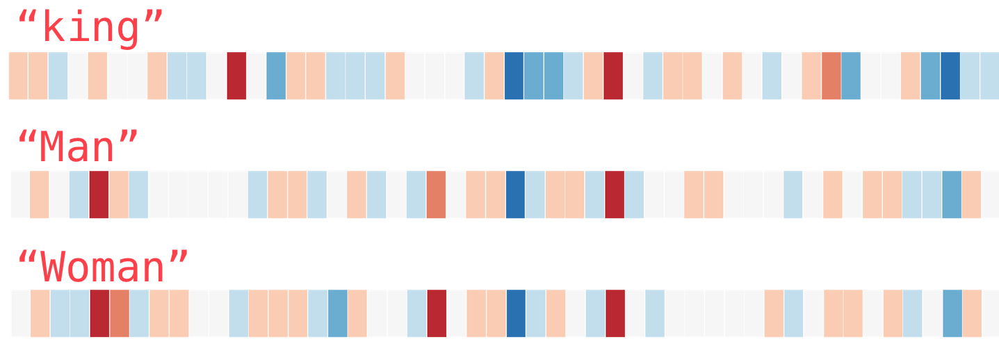

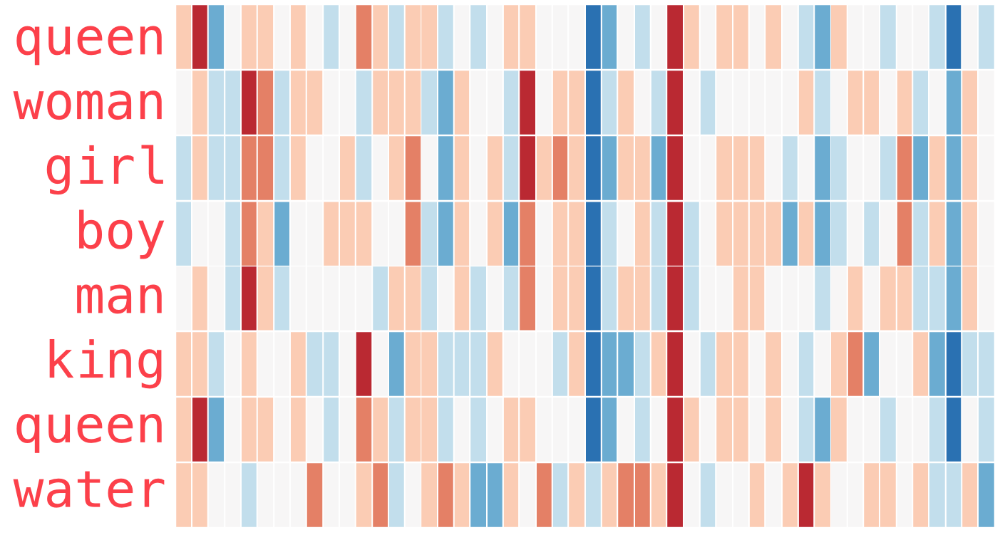



1.   There’s a straight red column through all of these different words. They’re similar along that dimension (and we don’t know what each dimensions codes for)
2.   You can see how “woman” and “girl” are similar to each other in a lot of places. The same with “man” and “boy”
3.   “boy” and “girl” also have places where they are similar to each other, but different from “woman” or “man”. Could these be coding for a vague conception of youth? possible.
4.   All but the last word are words representing people. I added an object (water) to show the differences between categories. You can, for example, see that blue column going all the way down and stopping before the embedding for “water”.
5.   There are clear places where “king” and “queen” are similar to each other and distinct from all the others.



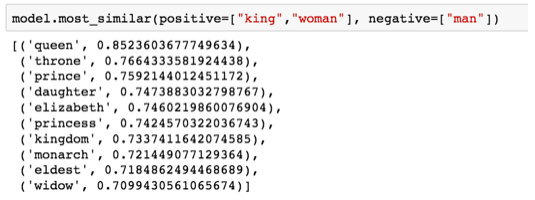

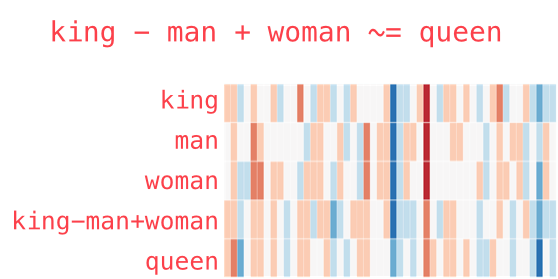

**Language Modeling**

If one wanted to give an example of an NLP application, one of the best examples would be the next-word prediction feature of a smartphone keyboard. It’s a feature that billions of people use hundreds of times every day.

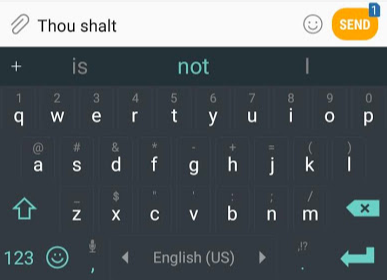

Next-word prediction is a task that can be addressed by a language model. A language model can take a list of words (let’s say two words), and attempt to predict the word that follows them.

In the screenshot above, we can think of the model as one that took in these two green words (thou shalt) and returned a list of suggestions (“not” being the one with the highest probability):

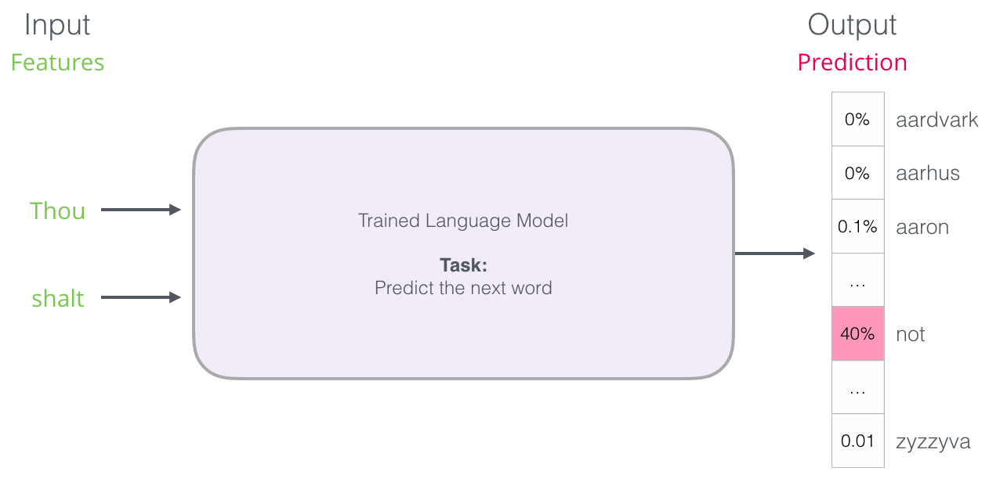

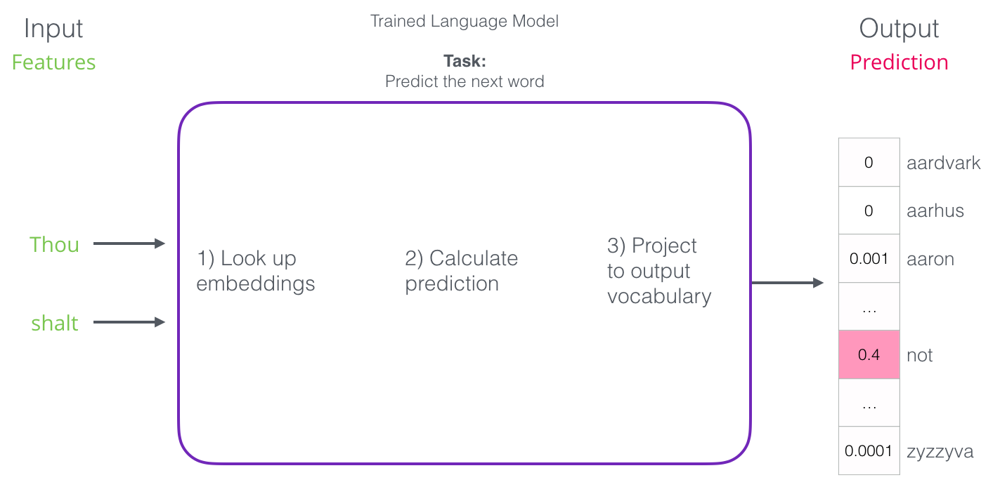

The first step is the most relevant for us as we discuss embeddings. One of the results of the training process was this matrix that contains an embedding for each word in our vocabulary. During prediction time, we just look up the embeddings of the input word, and use them to calculate the prediction:

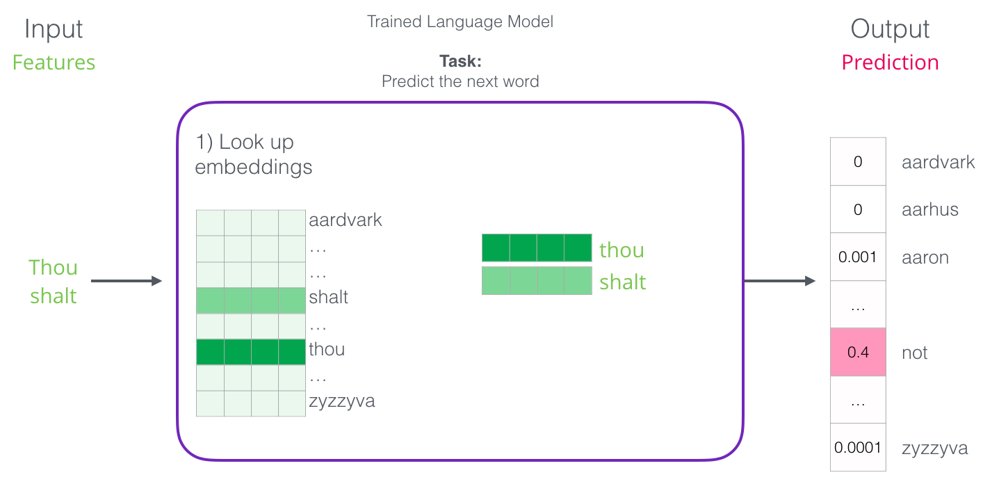

**Language Model Training**

Language models have a huge advantage over most other machine learning models. That advantage is that we are able to train them on running text – which we have an abundance of. Think of all the books, articles, Wikipedia content, and other forms of text data we have lying around. Contrast this with a lot of other machine learning models which need **hand-crafted features** and specially-collected data.

Words get their embeddings by us looking at which other words they tend to appear next to. The mechanics of that is that

1.  We get a lot of text data (say, all Wikipedia articles, for example). then
2.  We have a window (say, of three words) that we slide against all of that text.
3.  The sliding window generates training samples for our model

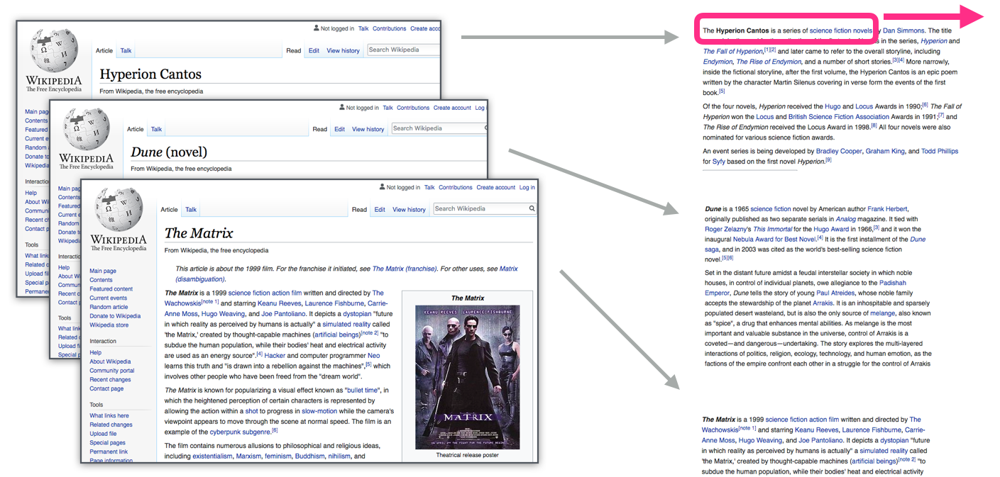

As this window slides against the text, we (virtually) generate a dataset that we use to train a model. To look exactly at how that’s done, let’s see how the sliding window processes this phrase:

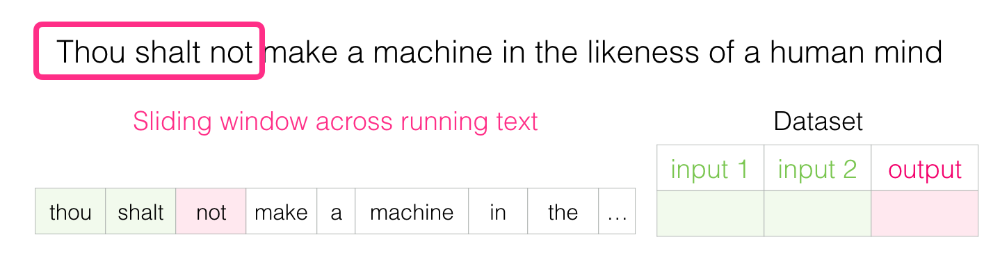

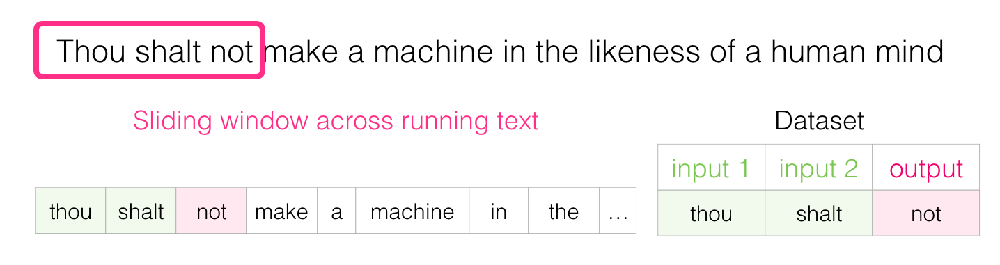

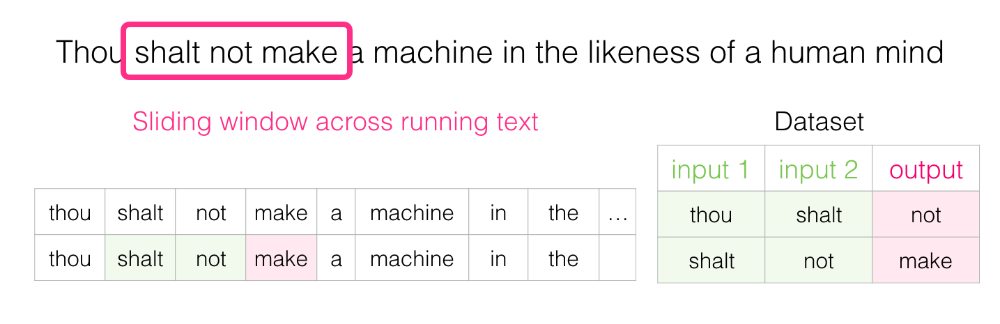

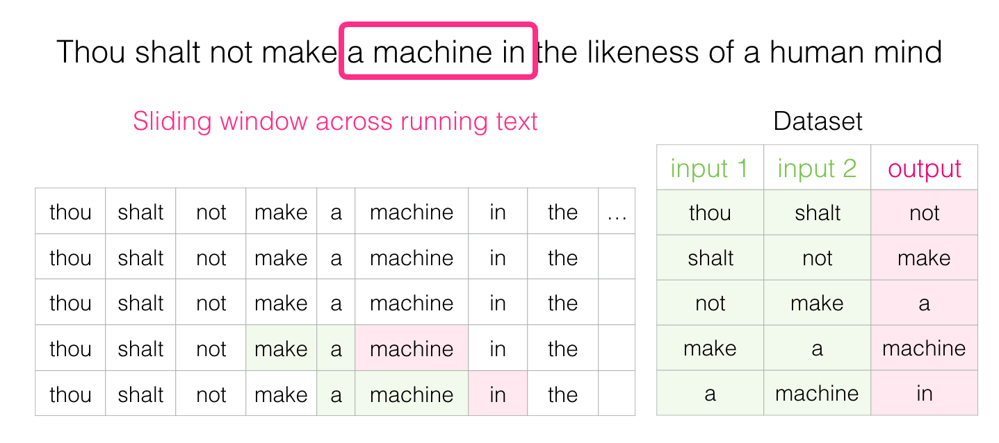

**Look both ways**

Knowing what you know from earlier in the post, fill in the blank:

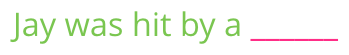

The context I gave you here is five words before the blank word (and an earlier mention of “bus”). I’m sure most people would guess the word bus goes into the blank. But what if I gave you one more piece of information – a word after the blank, would that change your answer?

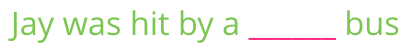

This completely changes what should go in the blank. the word red is now the most likely to go into the blank. What we learn from this is the words both before and after a specific word carry informational value. It turns out that accounting for both directions (words to the left and to the right of the word we’re guessing) leads to better word embeddings.

# **Continuous Bag of Words**

Instead of only looking two words before the target word, we can also look at two words after it.

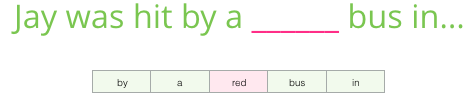

If we do this, the dataset we’re virtually building and training the model against would look like this:

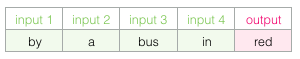

# **SkipGram**

Instead of guessing a word based on its context (the words before and after it), this other architecture tries to guess neighboring words using the current word. We can think of the window it slides against the training text as looking like this:

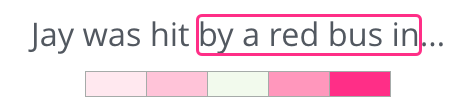

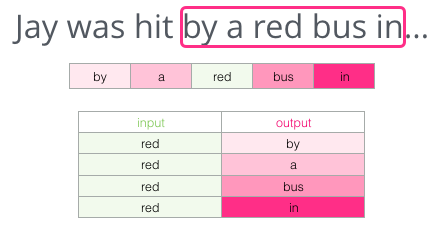

Window size : 5 and Middle word considered for every time as input and remaing 4 are it's neighbours

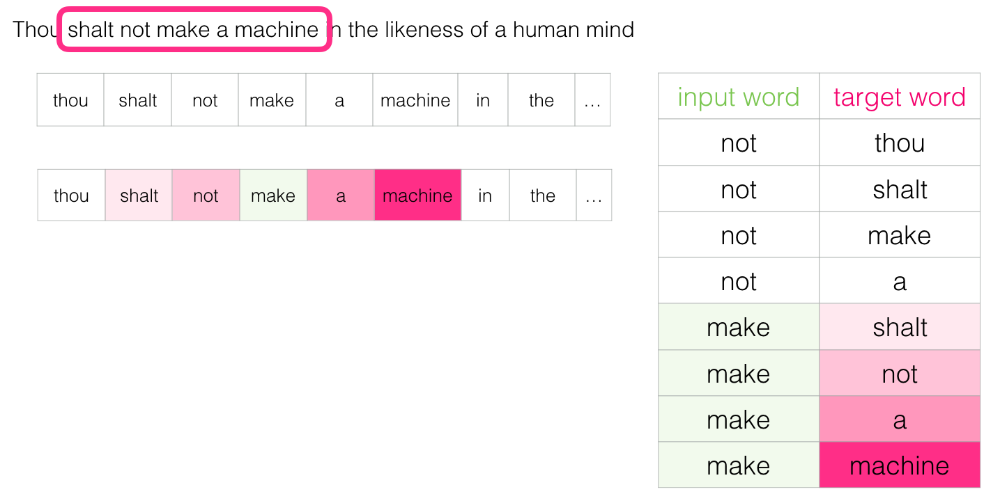

A couple of positions later, we have a lot more examples:

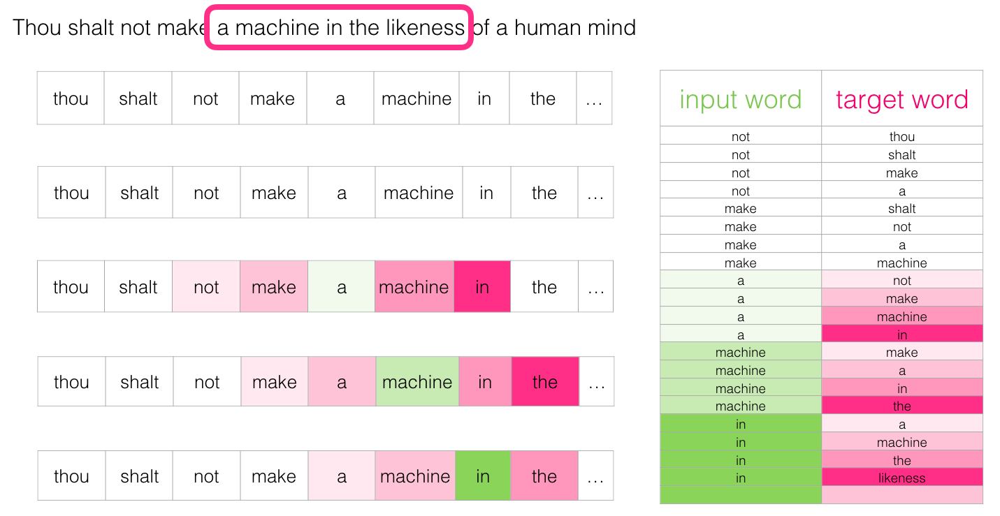

Now that we have our skipgram training dataset that we extracted from existing running text, let’s glance at how we use it to train a basic neural language model that predicts the neighboring word.

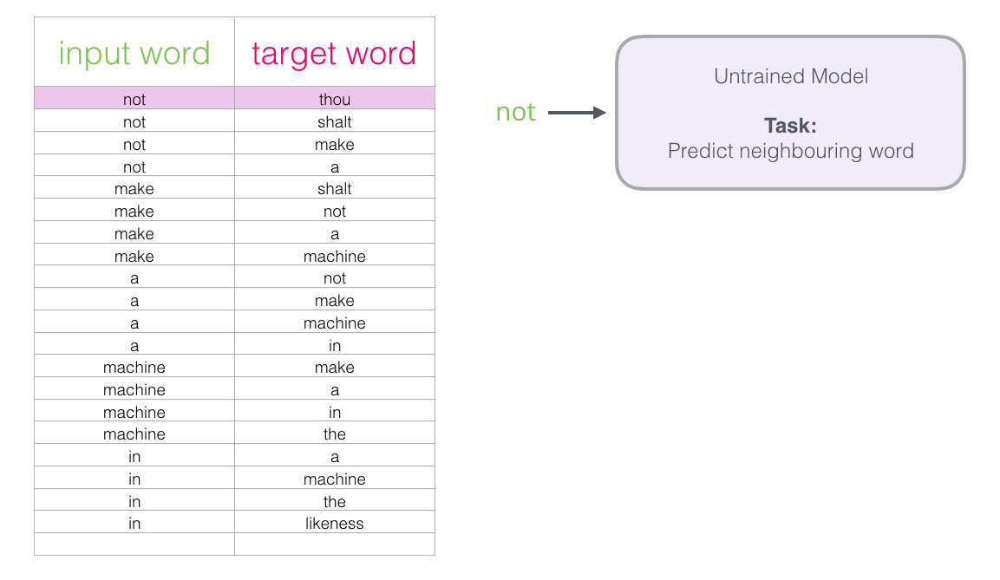

We start with the first sample in our dataset. We grab the feature and feed to the untrained model asking it to predict an appropriate neighboring word.


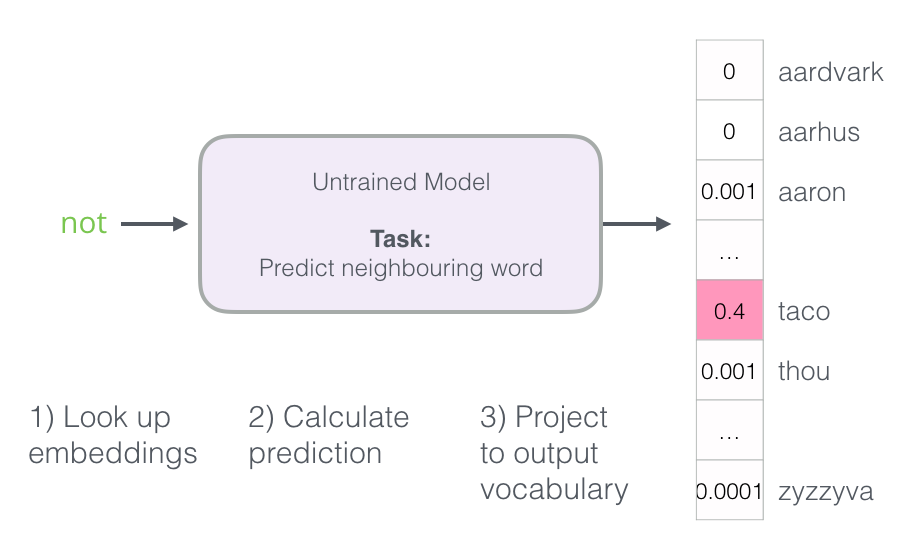

The model conducts the three steps and outputs a prediction vector (with a probability assigned to each word in its vocabulary). Since the model is untrained, it’s prediction is sure to be wrong at this stage. But that’s okay. We know what word it should have guessed – the label/output cell in the row we’re currently using to train the model:

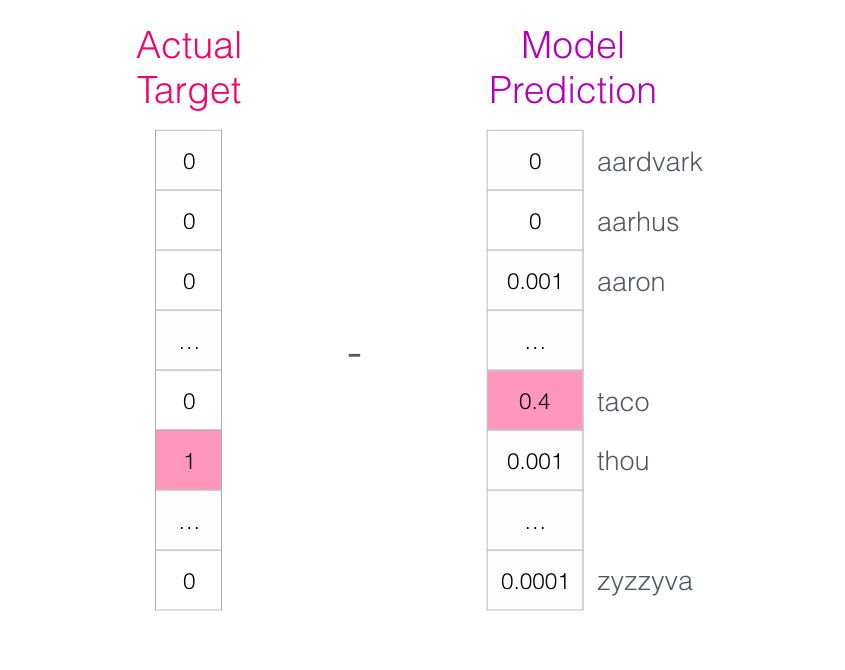

How far off was the model? We subtract the two vectors resulting in an error vector:

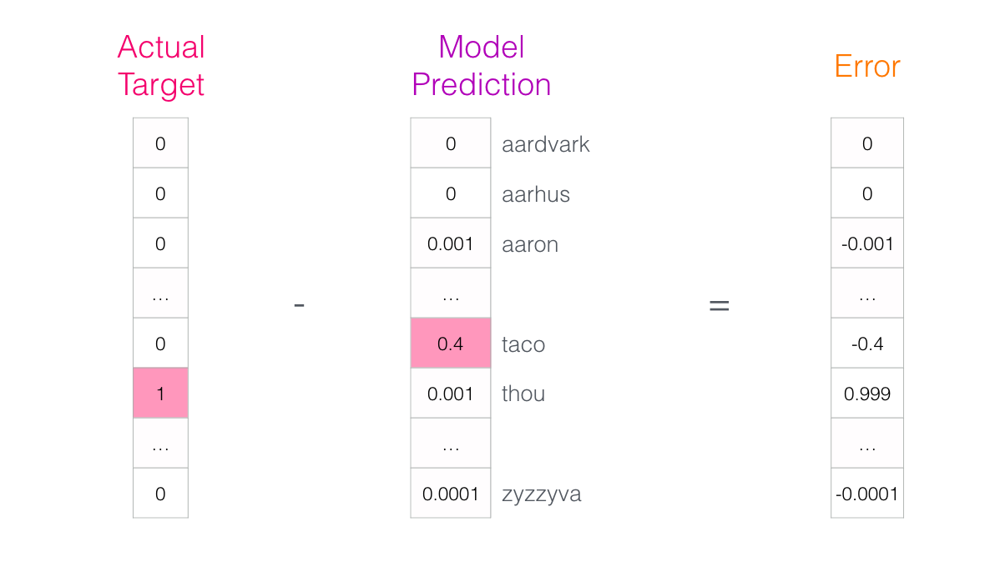

This error vector can now be used to update the model so the next time, it’s a little more likely to guess **thou** when it gets **not** as input.

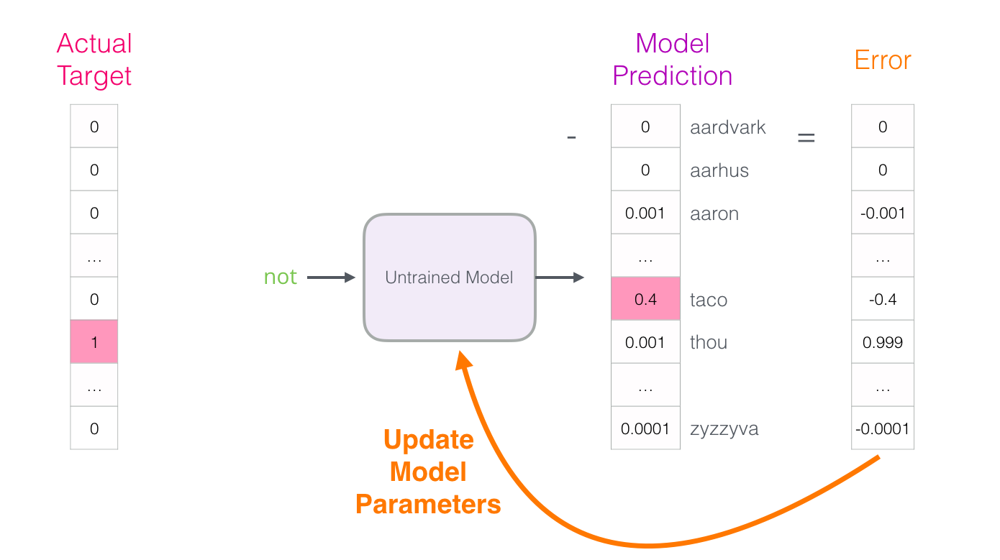


**Negative Sampling**

Recall the three steps of how this neural language model calculates its prediction:

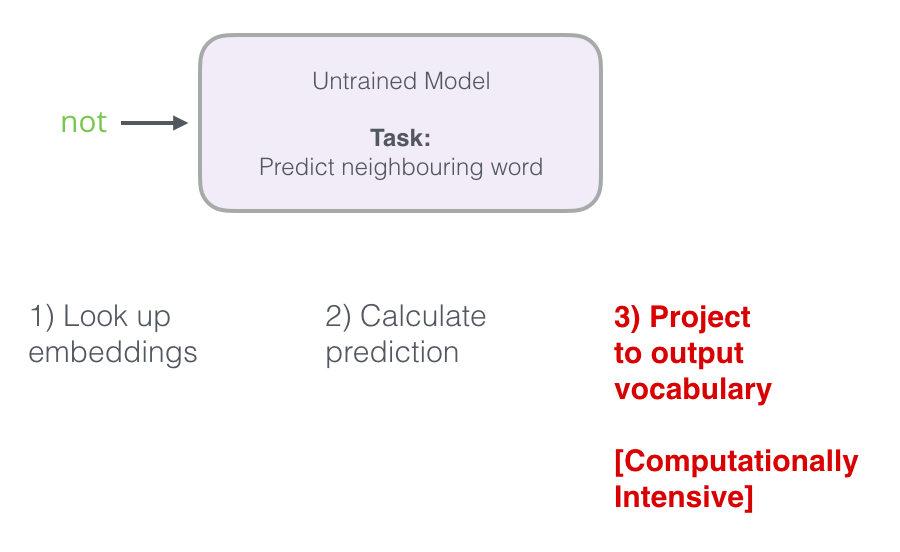

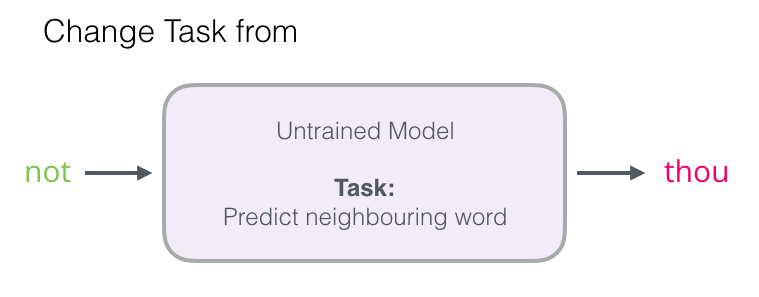

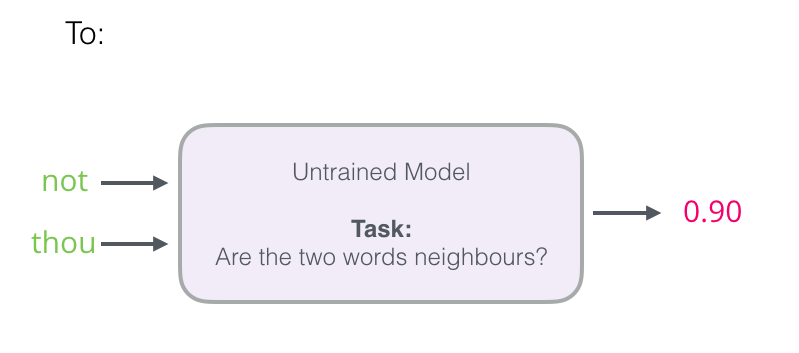

**Data**

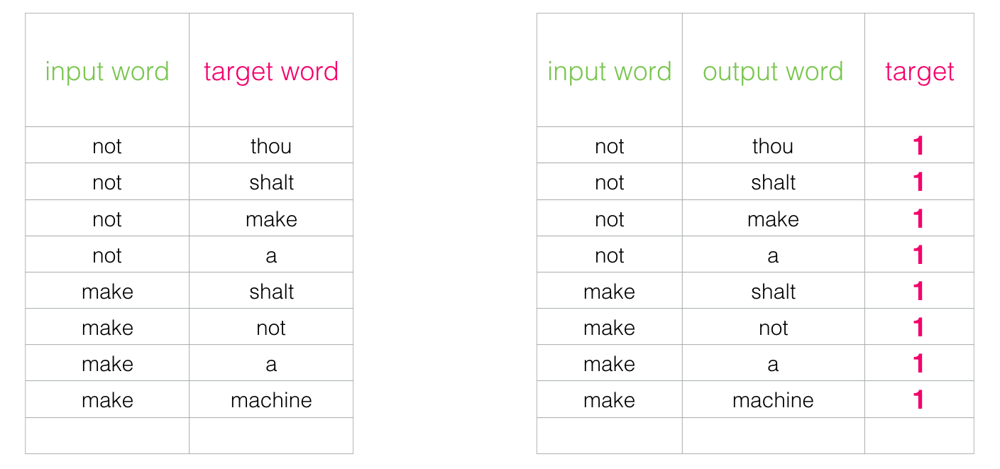

This can now be computed at blazing speed – processing millions of examples in minutes. But there’s one loophole we need to close. If all of our examples are positive (target: 1), we open ourself to the possibility of a smartass model that always returns 1 – achieving 100% accuracy, but learning nothing and generating garbage embeddings.

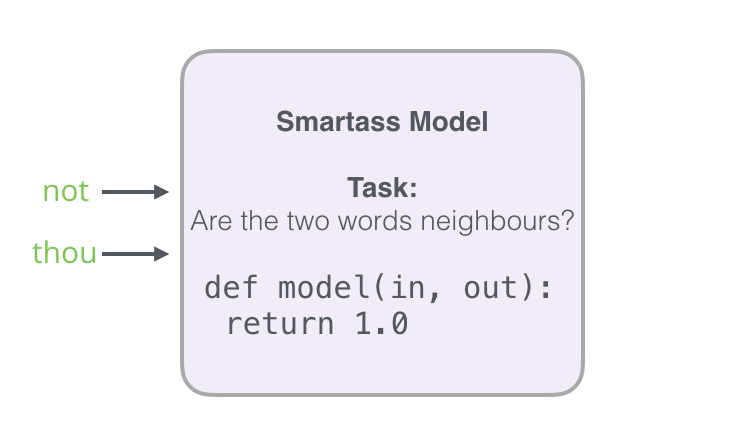

To address this, we need to introduce negative samples to our dataset – samples of words that are not neighbors. Our model needs to return 0 for those samples. Now that’s a challenge that the model has to work hard to solve – but still at blazing fast speed.

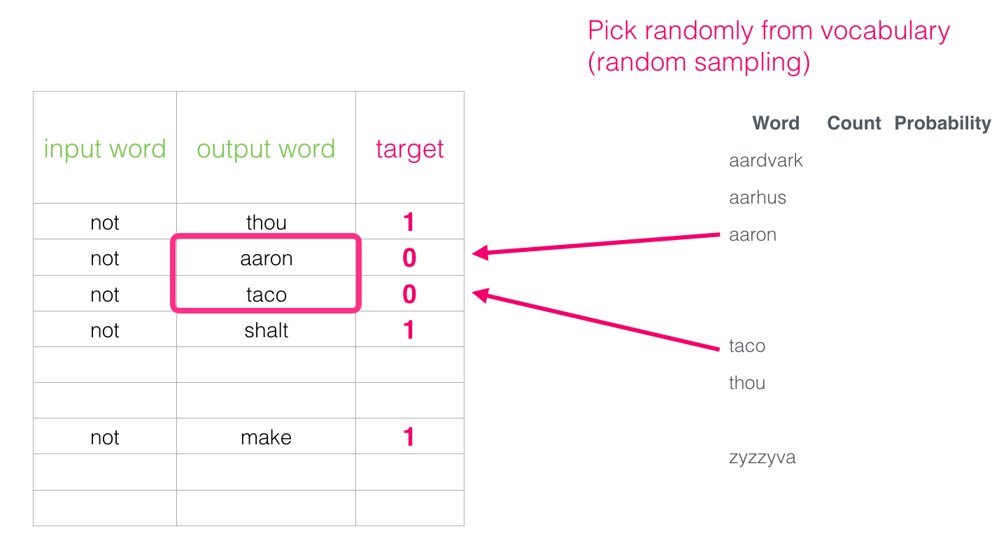

# **Skipgram with Negative Sampling (SGNS)**

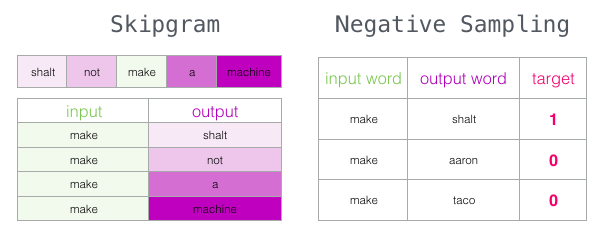

# **Word2vec Training Process**

Before the training process starts, we pre-process the text we’re training the model against. In this step, we determine the size of our vocabulary (we’ll call this vocab_size, think of it as, say, 10,000) and which words belong to it.

At the start of the training phase, we create two matrices – an Embedding matrix and a Context matrix. These two matrices have an embedding for each word in our vocabulary (So vocab_size is one of their dimensions). The second dimension is how long we want each embedding to be (embedding_size – 300 is a common value)

At the start of the training process, **we initialize these matrices with random values.**

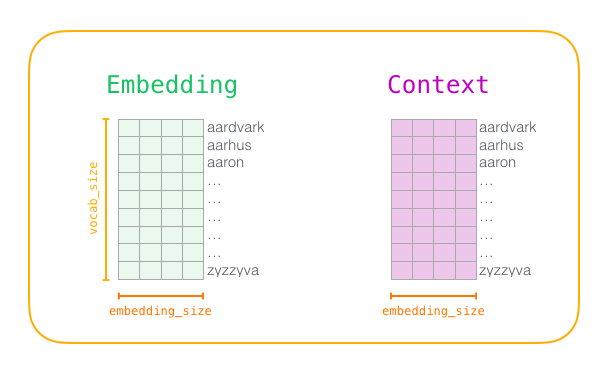

we start the training process. In each training step, we take one positive example and its associated negative examples. Let’s take our first group:

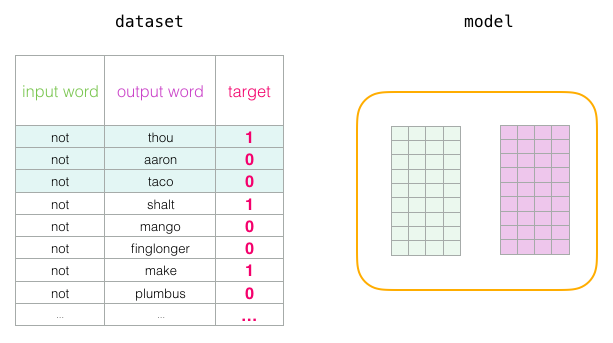

Now we have four words: the input word not and output/context words: thou (the actual neighbor), aaron, and taco (the negative examples). We proceed to look up their embeddings – for the input word, we look in the Embedding matrix. For the context words, we look in the Context matrix (even though both matrices have an embedding for every word in our vocabulary).

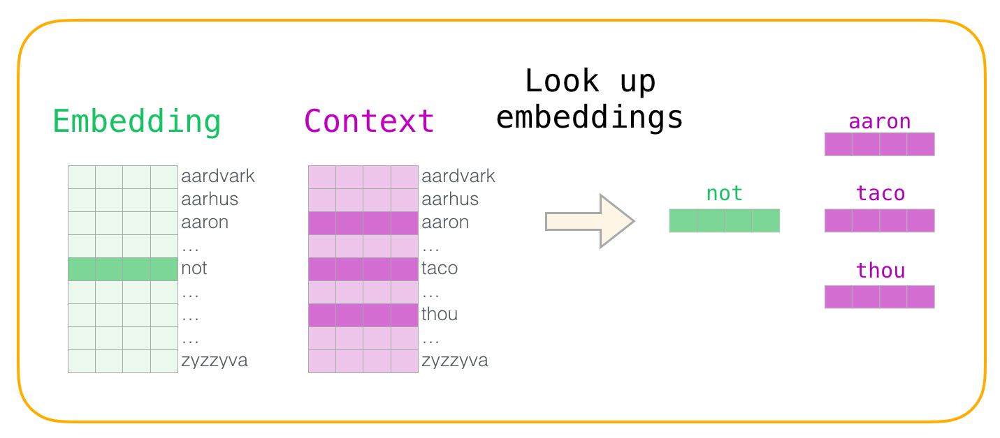

Then, we take the dot product of the input embedding with each of the context embeddings. In each case, that would result in a number, that number indicates the similarity of the input and context embeddings

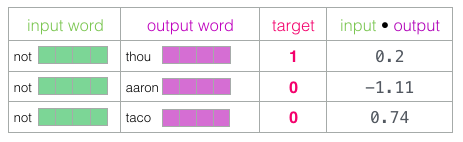

Now we need a way to turn these scores into something that looks like probabilities – we need them to all be positive and have values between zero and one. This is a great task for sigmoid

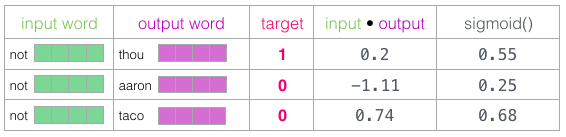

we can now treat the output of the sigmoid operations as the model’s output for these examples. You can see that taco has the highest score and aaron still has the lowest score both before and after the sigmoid operations.

Now that the untrained model has made a prediction, and seeing as though we have an actual target label to compare against, let’s calculate how much error (**error = target - sigmoid_scores**) is in the model’s prediction. To do that, we just subtract the sigmoid scores from the target labels.

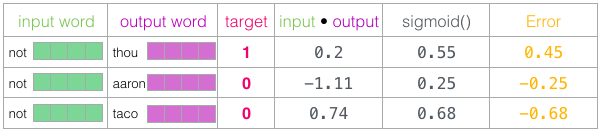

Here comes the “learning” part of “machine learning”. We can now use this error score to adjust the embeddings of not, thou, aaron, and taco so that the next time we make this calculation, the result would be closer to the target scores.



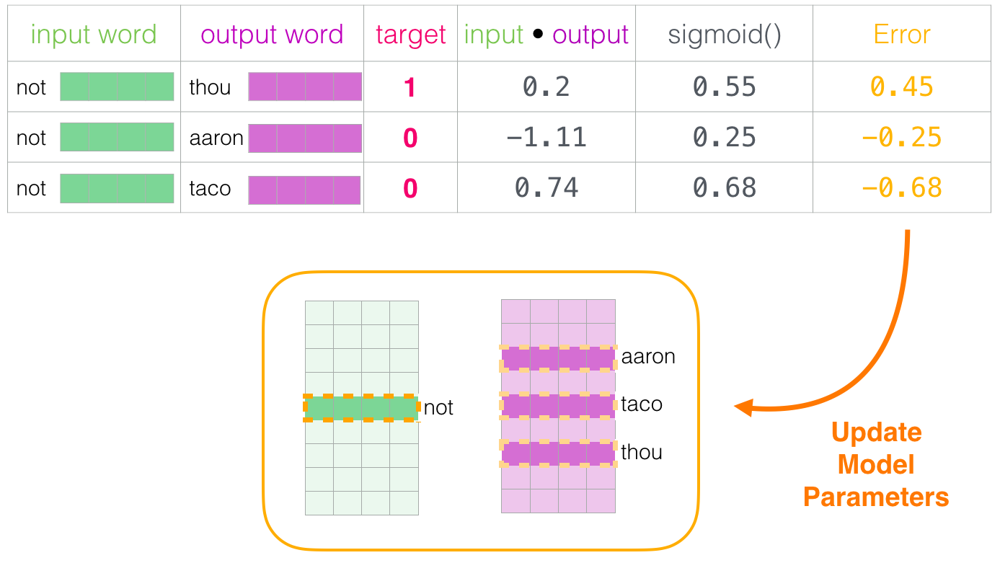

This concludes the training step. We emerge from it with slightly better embeddings for the words involved in this step (not, thou, aaron, and taco). We now proceed to our next step (the next positive sample and its associated negative samples) and do the same process again.

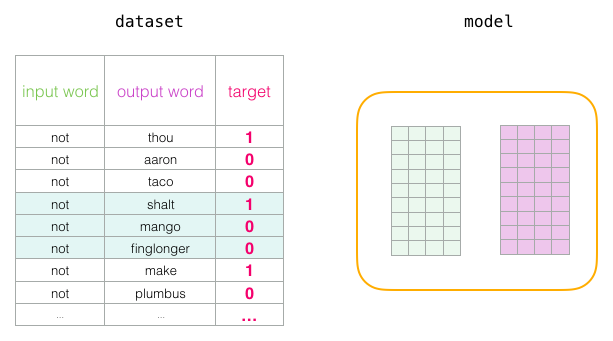

The embeddings continue to be improved while we cycle through our entire dataset for a number of times. We can then stop the training process, **discard the Context matrix**, and **use the Embeddings matrix as our pre-trained embeddings for the next task**.

**Window Size and Number of Negative Samples**

Two key hyperparameters in the word2vec training process are the window size and the number of negative samples.

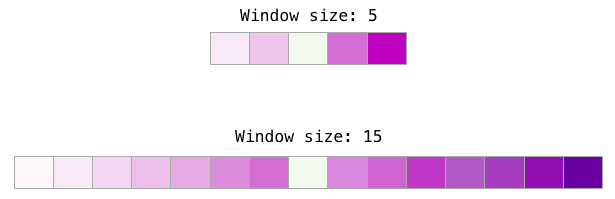

Different tasks are served better by different window sizes. One heuristic is that smaller window sizes (2-15) lead to embeddings where high similarity scores between two embeddings indicates that the words are interchangeable

Larger window sizes (15-50, or even more) lead to embeddings where similarity is more indicative of relatedness of the words.

The Gensim default window size is 5 (five words before and five words after the input word, in addition to the input word itself).

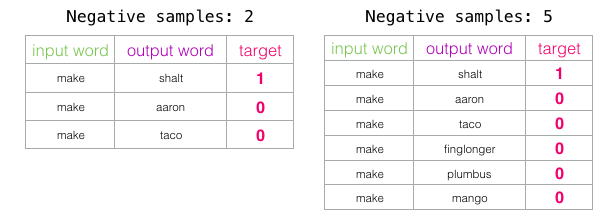

The number of negative samples is another factor of the training process. The original paper prescribes **5-20 as being a good number of negative samples**. It also states that **2-5 seems to be enough when you have a large enough dataset**. The Gensim default is **5 negative samples**.

**Word2Vec algorithms**


1.   Continoues Bag of Words (CBoW)
2.   Skip-Gram



**Continoues Bag of Words (CBoW)**

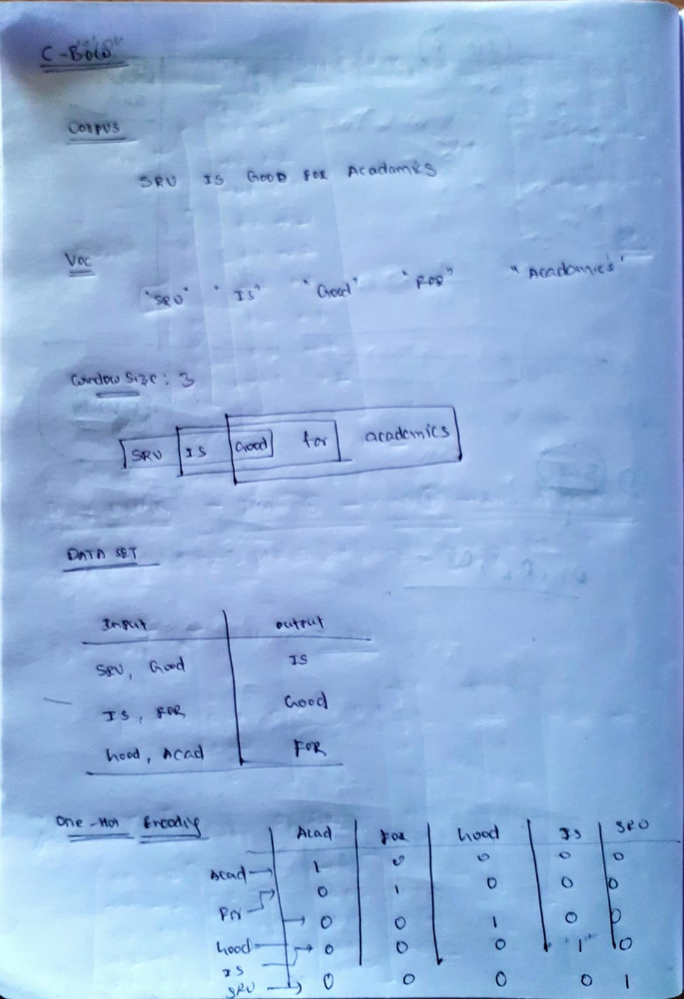

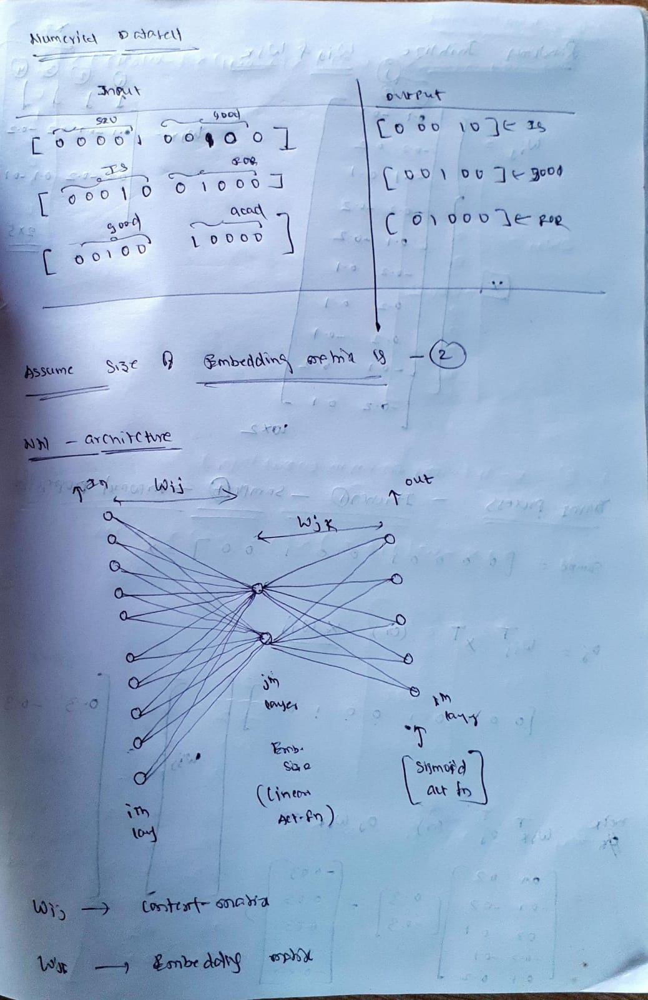

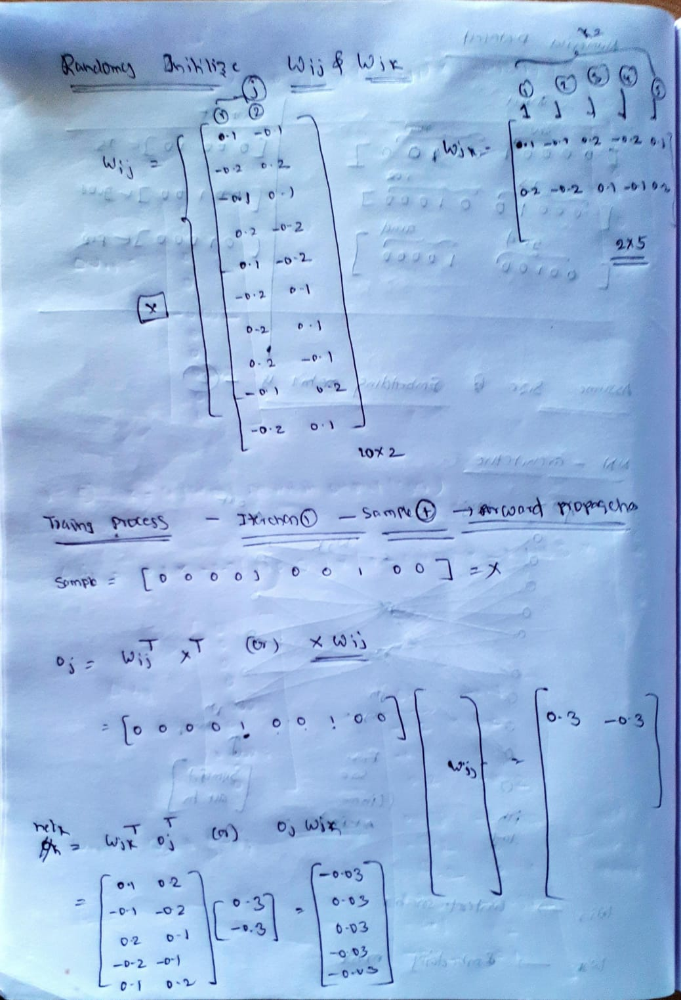

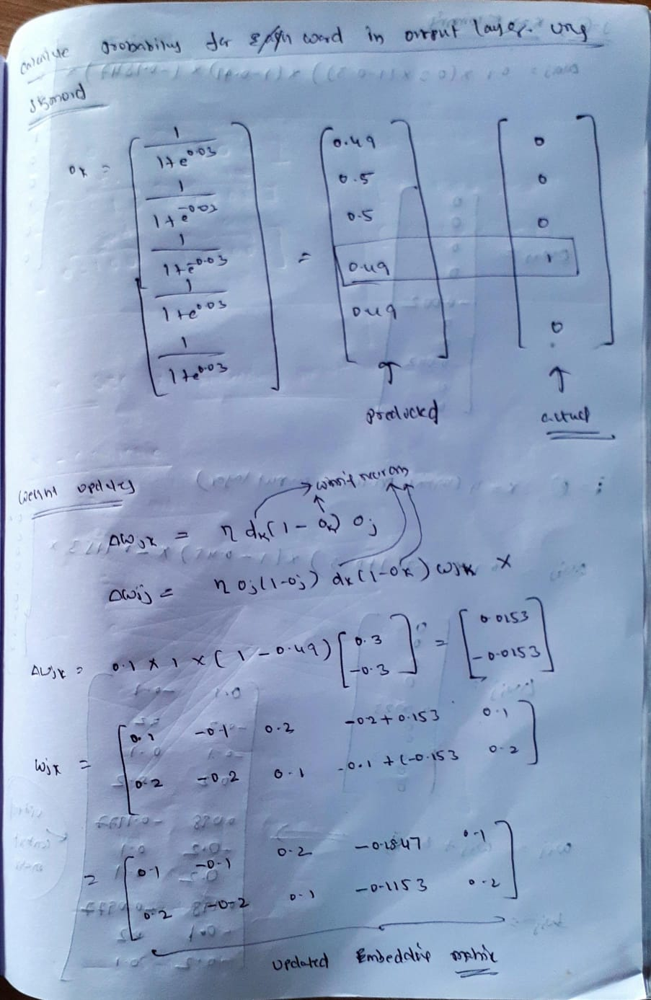

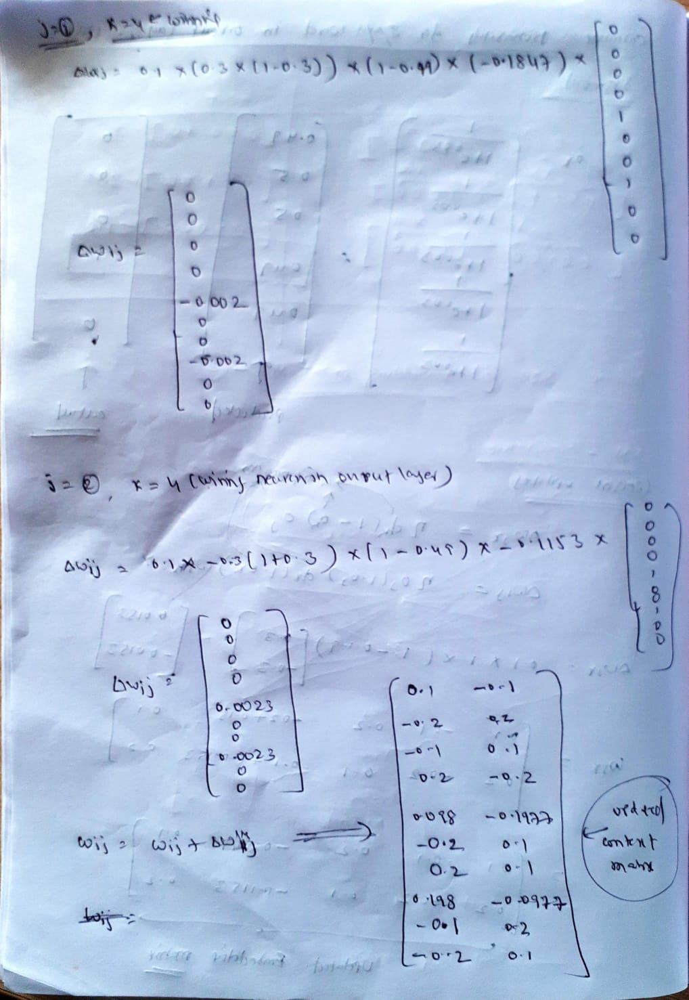

# **Skip-Gram**
Windowsize:3 and length of embedding:2

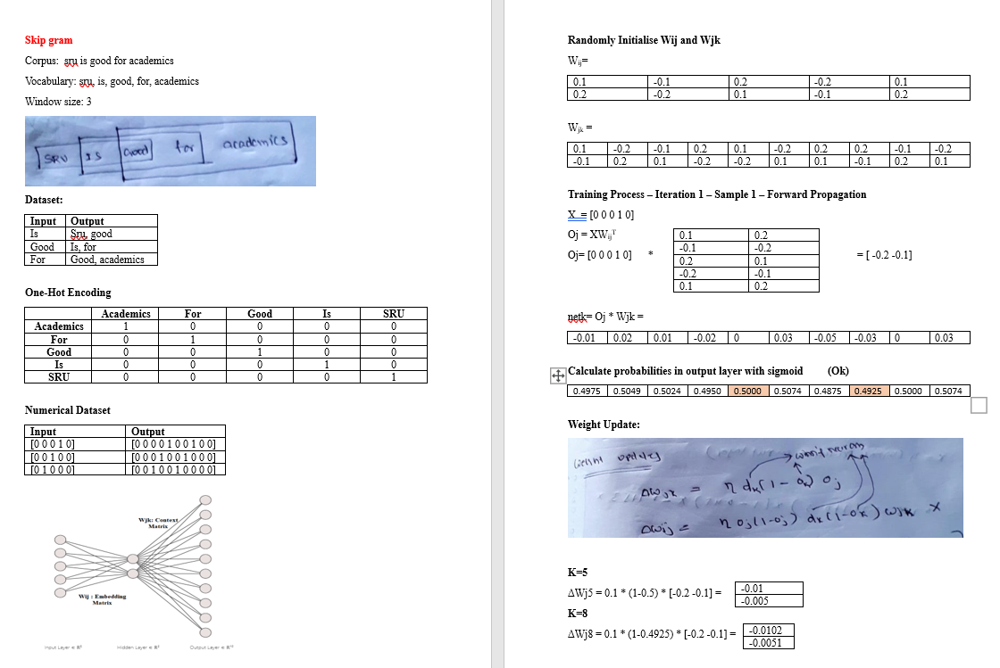

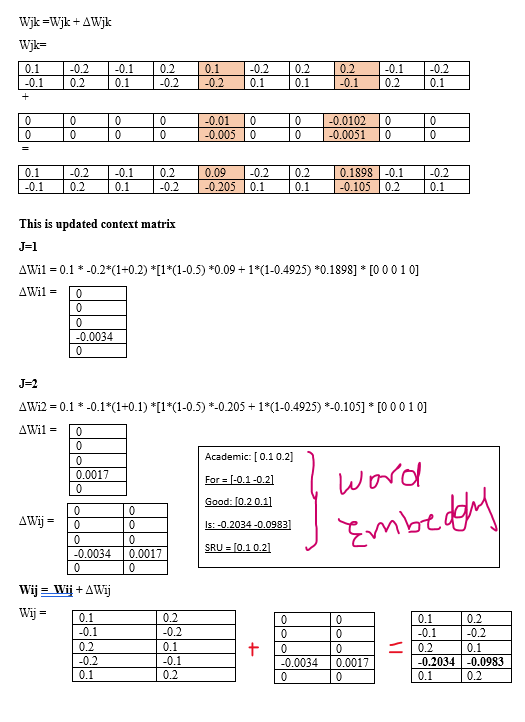

Large Data : SkipGram

Small Data:cBow

How we get most accurate  wordvec 



1.   Increase training data
2.   Increase dimensions of vector
3.   Increase window size



# **Word Embeddeing : Game of Thrones**

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
!pip install gensim

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import gensim
from gensim.models import Word2Vec
import os

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
from nltk import sent_tokenize
from gensim.utils import simple_preprocess

story = []
for filename in os.listdir('/content/drive/MyDrive/AI Data/NLP Data/GoT'):
    
    f = open(os.path.join('/content/drive/MyDrive/AI Data/NLP Data/GoT',filename),encoding='latin1')
    corpus = f.read()
    raw_sent = sent_tokenize(corpus)
    for sent in raw_sent:
        story.append(simple_preprocess(sent))
    

In [ ]:
#sg=1: skip-gram
#sg=0: cBoW
model = Word2Vec(story, vector_size=100, window=5, min_count=1, workers=4,sg=1)
model.save("word2vec.model")

In [ ]:
model = Word2Vec.load("word2vec.model")

In [ ]:
model.train(story, total_examples=model.corpus_count, epochs=model.epochs)

(6604064, 8628190)

In [ ]:
model.wv.most_similar('daenerys')

[('stormborn', 0.6901527643203735),
 ('viserys', 0.6620350480079651),
 ('targaryen', 0.6451684832572937),
 ('rhaegar', 0.6295642256736755),
 ('myrcella', 0.6172528266906738),
 ('arianne', 0.6036823987960815),
 ('aegon', 0.5907653570175171),
 ('aenar', 0.5873873829841614),
 ('unburnt', 0.584395170211792),
 ('xaro', 0.5807387828826904)]

In [ ]:
model.wv['king']

array([ 1.3734412 , -0.9005439 ,  1.9405917 ,  1.5042577 , -0.77813137,
        1.5983624 ,  2.0050354 , -0.45179623, -1.6637341 ,  0.88270336,
       -2.3092704 , -0.9078211 , -0.44500288,  0.89001554, -0.92320126,
       -0.8279567 , -0.98365694,  0.27514374, -0.01226357,  1.4177223 ,
        1.2265247 ,  0.05400155,  3.6281202 , -1.1620308 , -1.3368586 ,
        0.75971746, -1.1465989 ,  0.17152604, -0.2213164 ,  0.4489768 ,
       -0.6383302 , -1.1782601 ,  0.8644974 ,  1.2593904 ,  3.609433  ,
       -2.5385585 , -1.7158443 , -1.2506527 ,  0.5180335 , -1.1842213 ,
        0.34060076, -0.26503634,  0.9611976 , -0.39794993, -1.1715398 ,
       -0.97303504, -0.59513426, -2.2224338 ,  3.4755383 , -3.039695  ,
       -1.9433942 , -1.4852719 , -1.5627832 , -3.5887492 ,  2.7598825 ,
        0.32577023,  1.2677453 , -2.2686043 ,  1.8761501 ,  1.196582  ,
        0.577671  ,  0.7855487 ,  0.60630316, -0.3031989 , -1.0415889 ,
        0.8459923 ,  1.7480859 , -2.4691825 ,  0.5200135 , -0.62

In [ ]:
model.wv.doesnt_match(['cersei','jaime','bronn','tyrion'])

'bronn'

In [ ]:
model.wv.similarity('arya','sansa')

0.82311803

In [ ]:
y=model.wv.index_to_key
y

In [ ]:
y=model.wv.index_to_key
y

In [ ]:
model.wv['knife']

array([ 0.1203463 ,  0.21471778,  0.441442  , -1.1668158 ,  0.74533236,
        0.5247426 ,  1.3134537 , -0.53207034, -0.3911736 ,  0.21659979,
        0.5750517 , -0.03006371, -0.13784716, -0.63821965, -1.3885677 ,
        0.51508856, -1.1642785 , -0.45522565,  0.3517661 ,  0.2212199 ,
        1.677238  ,  0.17803237,  0.10201117,  0.75888014,  0.25571695,
        0.2310925 ,  0.9343569 , -0.9903919 , -0.8588936 , -1.0508002 ,
        1.1689088 , -0.8317921 ,  0.73305696, -0.8500444 ,  0.51597714,
        0.44540828, -0.6593637 ,  0.8090201 ,  1.1271787 ,  0.18204492,
        0.64596903, -0.47509933,  0.4861489 , -0.6343647 , -0.21294197,
       -0.11419864, -1.6047127 ,  1.1212618 , -0.38501164,  1.0269293 ,
        0.35594323, -0.6884442 ,  1.3413768 ,  0.7329314 , -0.47617   ,
        0.13069308, -0.7016274 ,  0.38694823,  1.1473448 , -0.81863   ,
       -0.24252842, -0.97034526,  0.7538271 , -1.3229886 , -0.5613322 ,
       -0.9460872 ,  0.8103223 ,  0.5086761 , -0.42141724, -0.05

Data Visualization

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=3)

In [ ]:
model.wv.get_normed_vectors()

array([[ 0.13214448, -0.11028121,  0.25409532, ...,  0.04807293,
        -0.01414723,  0.1457653 ],
       [-0.09133791, -0.09541795, -0.01088871, ..., -0.03453576,
        -0.0997567 ,  0.03337676],
       [ 0.10969855, -0.19540328, -0.09905266, ..., -0.00807664,
         0.06570452, -0.11872675],
       ...,
       [-0.02882396,  0.07108722,  0.13013385, ..., -0.04811774,
         0.10907393,  0.03553348],
       [-0.07916691,  0.13336934,  0.09854341, ..., -0.14631137,
         0.15713054, -0.06425188],
       [-0.05468598,  0.09922227,  0.139185  , ..., -0.19533478,
         0.08554214, -0.05698587]], dtype=float32)

In [ ]:
X = pca.fit_transform(model.wv.get_normed_vectors())

In [ ]:
X.shape

(23476, 3)

In [ ]:
import plotly.express as px
fig = px.scatter_3d(X[200:300],x=0,y=1,z=2, color=y[200:300])
fig.show()